In [268]:
#import tensorboard
#%load_ext tensorboard
#%tensorboard --logdir 'logs/'
import datetime
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import auc
from sklearn.metrics import roc_curve
from sklearn.metrics import precision_score
from sklearn.preprocessing import KBinsDiscretizer
from sklearn.model_selection import KFold
# Se importan librerías para graficar.
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import tensorflow as tf
from tensorflow import keras
from keras import backend as K
import kerastuner as kt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, BatchNormalization, Activation, Input, Dropout
from keras import regularizers
from keras.callbacks import ModelCheckpoint
from tensorflow.keras import optimizers
from sklearn.preprocessing import PolynomialFeatures
from keras.regularizers import l2, l1

In [269]:
df = pd.read_csv('diabetes.csv')

In [270]:
df.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,120.894531,69.105469,20.536458,79.799479,31.992578,0.471876,33.240885,0.348958
std,3.369578,31.972618,19.355807,15.952218,115.244002,7.884160,0.331329,11.760232,0.476951
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,62.000000,0.000000,0.000000,27.300000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,30.500000,32.000000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


In [271]:
healthy_people_num = (df['Outcome'] == 0).sum()
sick_people_num = (df['Outcome'] != 0).sum()
total = df.shape[0]
print("Healthy people: " + str(healthy_people_num))
print("Sick people: " + str(sick_people_num))
print("Total: " + str(total))

Healthy people: 500
Sick people: 268
Total: 768


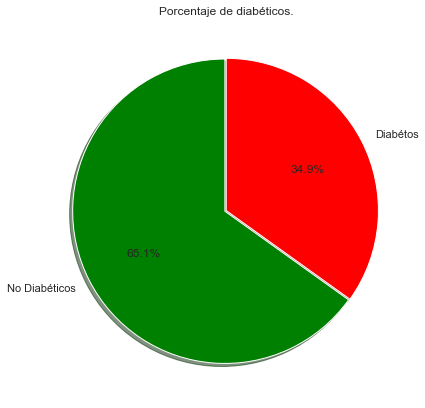

In [272]:
sns.set(style="whitegrid")
labels = ['No Diabéticos', 'Diabétos']
sizes = [healthy_people_num,sick_people_num]
colors = ["green","red"]
plt.figure(figsize=(7,7))
plt.pie(sizes, labels=labels, explode= (0.01,0) , colors=colors, autopct='%1.1f%%', shadow=True, startangle=90,)

plt.title('Porcentaje de diabéticos.')
plt.show()

In [273]:
df2 = df.copy()
df2[['Glucose','BloodPressure','SkinThickness','Insulin','BMI']] = df2[['Glucose','BloodPressure','SkinThickness','Insulin','BMI']].replace(0,np.NaN)

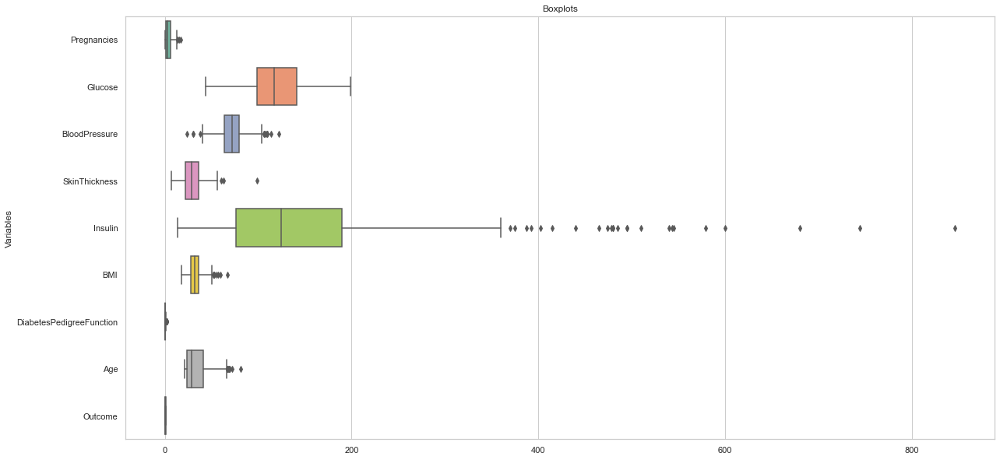

In [274]:
f, ax = plt.subplots(figsize=(20, 10))
plt.ylabel('Variables')
plt.title("Boxplots")
ax = sns.boxplot(data = df2, 
  orient = 'h', 
  palette = 'Set2')

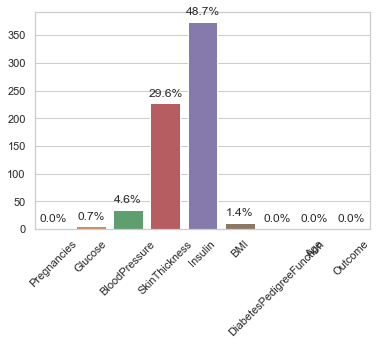

In [275]:
sns.set_theme(style="whitegrid")
ax = sns.barplot(x=df2.columns, y=df2.isnull().sum())
plt.xticks(rotation=45);
for p in ax.patches:
    ax.annotate(format(100*p.get_height()/df.shape[0], '.1f') + "%", 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 10), 
                   textcoords = 'offset points')

In [276]:
correlations = df2.corr()
correlations['Outcome'].sort_values(ascending=False)

Outcome                     1.000000
Glucose                     0.494650
BMI                         0.313680
Insulin                     0.303454
SkinThickness               0.259491
Age                         0.238356
Pregnancies                 0.221898
DiabetesPedigreeFunction    0.173844
BloodPressure               0.170589
Name: Outcome, dtype: float64

In [277]:
df = df.drop(['Insulin'], axis=1)
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,33.6,0.627,50,1
1,1,85,66,29,26.6,0.351,31,0
2,8,183,64,0,23.3,0.672,32,1
3,1,89,66,23,28.1,0.167,21,0
4,0,137,40,35,43.1,2.288,33,1


In [278]:
 def separate_data_and_labels(df):
        data = df.copy()
        y_values = data[data.columns[-1]].values.reshape(data.shape[0], 1)
        data = data.drop([data.columns[-1]], axis=1)
        return data, y_values

In [279]:
np.random.seed(0)
msk = np.random.rand(len(df)) < 0.8
train_val_df = df[msk]
testData = df[~msk]

train_val_data , y_train_val = separate_data_and_labels(train_val_df)
x_test_data, y_test_values = separate_data_and_labels(testData)

In [280]:
def specificity(y_true, y_pred):
    tn = K.sum(K.round(K.clip((1 - y_true) * (1 - y_pred), 0, 1)))
    fp = K.sum(K.round(K.clip((1 - y_true) * y_pred, 0, 1)))
    return tn / (tn + fp + K.epsilon())


def negative_predictive_value(y_true, y_pred):
    tn = K.sum(K.round(K.clip((1 - y_true) * (1 - y_pred), 0, 1)))
    fn = K.sum(K.round(K.clip(y_true * (1 - y_pred), 0, 1)))
    return tn / (tn + fn + K.epsilon())

def sensitivity(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    sens_keras = true_positives / (possible_positives + K.epsilon())
    return sens_keras

def positive_predictive_value(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    ppv_keras = true_positives / (predicted_positives + K.epsilon())
    return ppv_keras

In [281]:
def plot_loss(history):
    # Plot the training loss.
    plt.plot(history.history['loss'], 'r-')
    # Plot the validation loss.
    plt.plot(history.history['val_loss'], 'b-')
    # X-axis label.
    plt.xlabel('Epochs')
    # Y-axis label.
    plt.ylabel('Cost')
    # Graph legend.
    plt.legend(["Training loss", "Validation loss"])
    # Graph title.
    plt.title('Loss Graph')
    plt.show()

In [372]:
class DiabetesPredictor:
    def __init__(self, name):
        """DiabetesPredictor

    This is a class contains the most part of the methods needed for the diabetes predictor,
    first get the data of the csv file and then perform some methods to clean the data insid
    and allows you to choose if it has to replace outliers or not and replace nulls values or not.

    """
        self.name = name

    def fit(self, train_df, y_train, val_df, y_val, replaceOutliers=False, replaceNulls=False, nullColumns=[], outliersColumnsMap={}, columnsToRemove=[], polyFeatDeg = -1, binsDiscretizer = -1, earlyStop = False, dropOut = False, regu = '', batchNormalization = False, learning_rate = 1e-3, momentum= 0.99, decay = 1e-4, multilayer = False, layerUnits = [], epochs = 120, testing = False):
        train_dataframe = train_df.copy()

        self.columnsToRemove = columnsToRemove.copy()
        self.nullCols = nullColumns.copy()
        self.replaceNulls = replaceNulls
        self.replaceOutliers = replaceOutliers
        self.polyFeatDeg = polyFeatDeg
        self.binsDiscretizer = binsDiscretizer
        self.earlyStop = earlyStop
        self.dropOut = dropOut
        self.regu = regu
        self.batchNormalization = batchNormalization
        self.learning_rate = learning_rate
        self.momentum = momentum
        self.decay = decay
        self.multilayer = multilayer
        self.layerUnits = layerUnits
        self.epochs = epochs
        self.testing = testing

        self.replace_values_nulls = []
        self.replace_values_outliers = []
        self.outliersLimits = []
        self.history = None

        self.nullCols = [n for n in self.nullCols if n not in self.columnsToRemove]
        self.outlierCols = {}
        for k in outliersColumnsMap:
            if k not in self.columnsToRemove:
                self.outlierCols[k] = outliersColumnsMap[k].copy()

        train_dataframe = self.__preprocess_data__(train_dataframe, training=True)

        x_train_values = train_dataframe.values
        y_train_values = y_train.copy()

        self.input_shape = x_train_values.shape

        x_val_df = val_df.copy()
        x_val_df = self.__preprocess_data__(x_val_df)
        x_val_values = x_val_df.values
        y_val_values = y_val.copy()

        self.model = self.__train_model__(x_train_values, y_train_values, x_val_values,y_val_values)

        self.auc, self.spe, self.sen, self.ppv, self.npv, self.fpr, self.tpr = self.evaluate(x_val_df, y_val_values)

        if not self.testing:
            self.aucTrain, self.speTrain, self.senTrain, self.ppvTrain, self.npvTrain, self.fprTrain, self.tprTrain = self.evaluate(train_dataframe, y_train_values)
        
    def __preprocess_data__(self, data, training = False):
        df = data.copy()
        df = self.__remove_columns__(df)

        if self.replaceNulls:
            df[self.nullCols] = df[self.nullCols].replace(0,np.NaN)

        if training:
            self.replace_values_outliers = self.__get_cols_median__(df)
            self.outliersLimits = self.__get_outliers_limits__(df)

        if(self.replaceOutliers):
            df = self.__replace_outliers__(df)

        if training:
            self.replace_values_nulls = self.__get_cols_median__(df)

        if(self.replaceNulls):
            df = self.__replace_nulls__(df)

        if (self.polyFeatDeg > 0):
            poly = PolynomialFeatures(degree=self.polyFeatDeg)
            polyArray = poly.fit_transform(df)
            c = poly.get_feature_names(df.columns)
            df = pd.DataFrame(polyArray, columns = c)

        if (self.binsDiscretizer > 1):
            disc = KBinsDiscretizer(n_bins=self.binsDiscretizer, encode='ordinal', strategy='uniform')
            df = disc.fit_transform(df)

        if training:
            self.mean_cols = self.__get_cols_mean__(df)
            self.std_cols = self.__get_cols_std__(df)

        df = self.__normalize_data__(df)

        return df

    def __get_cols_mean__(self, data):
        meandf = data.mean(axis = 0)
        meandf.columns = data.columns
        return meandf

    def __get_cols_std__(self, data):
        stddf= data.std(axis = 0)
        stddf.columns = data.columns
        return stddf

    def __get_cols_median__(self, data):
        mediandf = data.median(axis = 0)
        mediandf.columns = data.columns
        return mediandf

    def __get_outliers_limits__(self, data):
        df = pd.DataFrame(np.zeros((1,len(data.columns))), columns=data.columns)
        df = df.astype('object')
        for col in data.columns:
            col_min = 0
            col_max = np.Infinity
            if (col in self.outlierCols):
                #Cálculo de parámetros para obtener los outliers.
                q1 = data[col].quantile(0.25)
                q3 = data[col].quantile(0.75)
                iqr = q3-q1
                #Límites de los valores tipicos.
                lower_tail = q1 - 1.5 * iqr
                upper_tail = q3 + 1.5 * iqr

                col_min = min(lower_tail, self.outlierCols[col][0])
                col_max = max(upper_tail,self.outlierCols[col][1])
            lims = [col_min, col_max]
            df[col][0] = lims
        return df

    def __replace_outliers__(self, dataframe):
        #Para cada columna (excepto para el Outcome) se reemplazan los outliers por su mediana.
        df = dataframe.copy()
        for col in df.columns:
            out_min = self.outliersLimits[col][0][0]
            out_max = self.outliersLimits[col][0][1]
            for i in df[col]:
                if i > out_max or i < out_min:
                    df[col] = df[col].replace(i, self.replace_values_outliers[col])
        return df

    def __replace_nulls__(self, dataframe):
        df = dataframe.copy()
        for col in self.nullCols:
            df[col]=df[col].replace(np.NaN, self.replace_values_nulls[col])
        return df

    def __normalize_data__(self, dataframe):
        # Mean, columnar axis.
        df = dataframe.copy()
        for col in df.columns:
            if (self.std_cols[col] != 0):
                df[col] = (df[col] - self.mean_cols[col]) / self.std_cols[col]
            else:
                df[col] = 0
        return df

    def __remove_columns__(self, dataframe):
        df = dataframe.copy()
        df = df.drop(self.columnsToRemove, axis=1)
        return df

    def __model_builder__(self):
        model = Sequential()
        ini = tf.keras.initializers.GlorotNormal(seed=7)
        reg = None
        if(self.regu == 'l1' or self.regu == 'l2'):
            reg = reg_wrapper(self.regu, 0.1)
        if (self.multilayer):
            if (self.batchNormalization):
                model.add(BatchNormalization())
            elif (self.dropOut):
                model.add(Dropout(0.5))
            model.add(Dense(self.layerUnits[0], kernel_initializer=ini, bias_initializer=ini,kernel_regularizer=reg, activation='relu'))
            if (self.batchNormalization):
                model.add(BatchNormalization())
            elif (self.dropOut):
                model.add(Dropout(0.5))
            model.add(Dense(self.layerUnits[1], kernel_initializer=ini, bias_initializer=ini,kernel_regularizer=reg, activation='relu'))
            if (self.batchNormalization):
                model.add(BatchNormalization())
            elif (self.dropOut):
                model.add(Dropout(0.5))
            model.add(Dense(1, kernel_initializer=ini, bias_initializer=ini,kernel_regularizer=reg,activation='sigmoid'))
        else:
            if(self.dropOut):
                model.add(Dropout(0.5))
            elif(self.batchNormalization):
                model.add(BatchNormalization())

            
            model.add(Dense(1, kernel_initializer=ini,bias_initializer=ini,kernel_regularizer=reg, activation='sigmoid'))

        model.compile(optimizer=optimizers.SGD(learning_rate=self.learning_rate, momentum=self.momentum, decay = self.decay),
                        loss=keras.losses.BinaryCrossentropy(),
                        metrics=[tf.keras.metrics.AUC()])
        return model

    def __train_model__(self, x_train, y_train, x_val, y_val):        
        stop_early = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5)

        model = self.__model_builder__()

        ckpt_model = 'saved_models/'+ self.name
        checkpoint = ModelCheckpoint(ckpt_model, 
                            monitor='val_loss',
                            verbose=0,
                            save_weights_only=True,
                            save_best_only=True,
                            mode='min')

        # cbks = [checkpoint]
        cbks = []
        if (self.earlyStop):
            cbks.append(stop_early)
        
        history = model.fit(x_train, y_train, epochs=self.epochs, batch_size=64, validation_data = (x_val, y_val), verbose=0, callbacks = cbks)

        self.history = history
        # Plot Loss
        plot_loss(history)        

        # Return trained model
        return model

    def evaluate(self, x_val_df, y_val):
        x_df = x_val_df.copy()
        predictions, rounded_preds = self.predict(x_df)

        fpr_keras, tpr_keras, thresholds_keras = roc_curve(y_val, predictions)
        auc_keras = auc(fpr_keras, tpr_keras)
        spe = specificity(y_val.astype(float),  rounded_preds.astype(float))
        sen = sensitivity(y_val.astype(float),  rounded_preds.astype(float))
        ppv = positive_predictive_value(y_val.astype(float), rounded_preds.astype(float))
        npv = negative_predictive_value(y_val.astype(float), rounded_preds.astype(float))

        if (self.testing):
            self.plot_roc(fpr_keras, tpr_keras, auc_keras)
            print('AUC ' + str(auc_keras))
            print('Specificity: ' + str(spe))
            print('Sensitivity: ' + str(sen))
            print('Positive Predictive Value: ' + str(ppv))
            print('Negative Predictive Value: ' + str(npv))

        return auc_keras, spe, sen, ppv, npv, fpr_keras, tpr_keras

    def predict(self, x_val_df):
        x_df = x_val_df.copy()
        predictions = self.model(x_df.values)
        rounded_preds = np.rint(predictions)
        return predictions, rounded_preds

    def plot_roc_validation(self):
        self.plot_roc(self.fpr, self.tpr, self.auc)

    def plot_roc(self, fpr, tpr, auc):
        plt.figure(1)
        plt.plot([0, 1], [0, 1], 'k--')
        plt.plot(fpr, tpr, label=' (Area = {:.3f})'.format(auc))
        plt.xlabel('False positive rate')
        plt.ylabel('True positive rate')
        plt.title('ROC curve ' + self.name)
        plt.legend(loc='best')
        plt.show()

In [283]:
def reg_wrapper(type, value):
    if type == 'l2':
        return regularizers.l2(value)
    if type == 'l1':
        return regularizers.l1(value)

In [354]:
kf = KFold(n_splits = 5)

def cross_val(name, replaceOutliers=False, replaceNulls=False, nullColumns=[], outliersColumnsMap={}, columnsToRemove=[], polyFeatDeg = -1, binsDiscretizer = -1, earlyStop = False, dropOut = False, regu = '', batchNormalization = False, learning_rate = 1e-3, momentum= 0.99, decay = 1e-4, multilayer = False, layerUnits = [], epochs = 120, testing = False):
    folds = kf.split(train_val_data)
    bestModel = None
    aucs = []
    spes = []
    sens = []
    ppvs = []
    npvs = []
    aucsTrain = []
    i = 0
    for train_index, val_index in folds:
        print('Fold ' + str(i))
        newModel = DiabetesPredictor(name + str(i))
        i += 1
        X_train, X_val = train_val_data.iloc[train_index], train_val_data.iloc[val_index]
        Y_train, Y_val = y_train_val[train_index], y_train_val[val_index]
        newModel.fit(X_train, Y_train, X_val, Y_val, replaceOutliers=replaceOutliers, replaceNulls=replaceNulls, nullColumns = nullColumns, outliersColumnsMap=outliersColumnsMap, columnsToRemove=columnsToRemove, polyFeatDeg=polyFeatDeg, binsDiscretizer=binsDiscretizer, earlyStop=earlyStop, dropOut=dropOut, regu=regu, batchNormalization=batchNormalization, learning_rate = learning_rate, momentum= momentum, decay = decay, multilayer = multilayer, layerUnits = layerUnits, epochs = epochs, testing = testing)
        aucs.append(newModel.auc)
        spes.append(newModel.spe)
        sens.append(newModel.sen)
        ppvs.append(newModel.ppv)
        npvs.append(newModel.npv)
        aucsTrain.append(newModel.aucTrain)
        if (bestModel==None or newModel.auc > bestModel.auc):
            bestModel = newModel
    
    aucTrainMean = np.mean(np.array(aucsTrain))
    aucMean = np.mean(np.array(aucs))
    speMean = np.mean(np.array(spes))
    senMean = np.mean(np.array(sens))
    ppvMean = np.mean(np.array(ppvs))
    npvMean = np.mean(np.array(npvs))

    print('AUC Val: ' + str(aucMean))
    print('AUC Train: ' + str(aucTrainMean))
    print('Specificity: ' + str(speMean))
    print('Sensitivity: ' + str(senMean))
    print('Positive Predictive Value: ' + str(ppvMean))
    print('Negative Predictive Value: ' + str(npvMean))

    
    return bestModel, aucMean, speMean, senMean, ppvMean, npvMean, aucTrainMean

### Sin limpiar datos

Fold 0


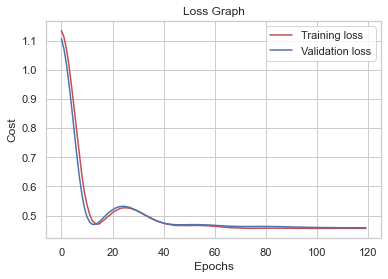

Fold 1


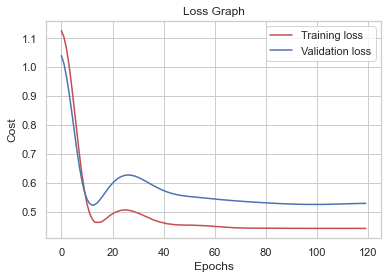

Fold 2


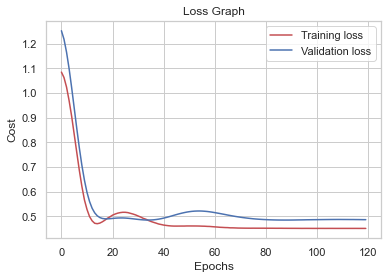

Fold 3


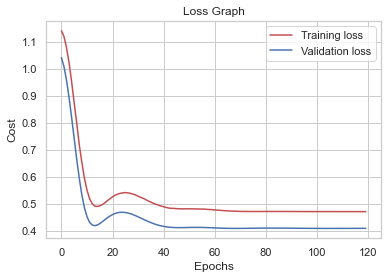

Fold 4


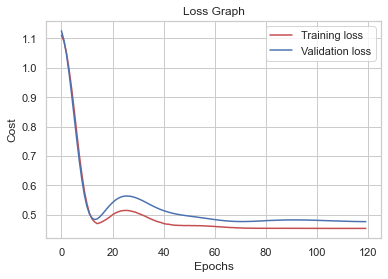

AUC Val: 0.8422832243929449
AUC Train: 0.850974782033305
Specificity: 0.882005775194996
Sensitivity: 0.5899191695394597
Positive Predictive Value: 0.7263480207896809
Negative Predictive Value: 0.79564358321741


In [285]:
simplePred, aucPred, spePred, senPred, ppvPred, npvPred, aucTrainPred = cross_val('predictor')

## Limpiando Datos
#### Reemplazando Nulls por la mediana

Fold 0


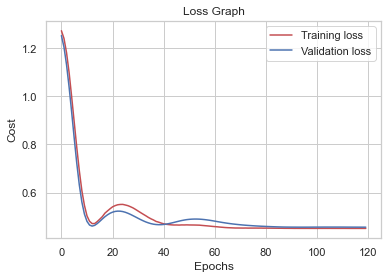

Fold 1


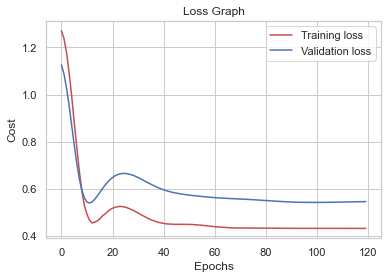

Fold 2


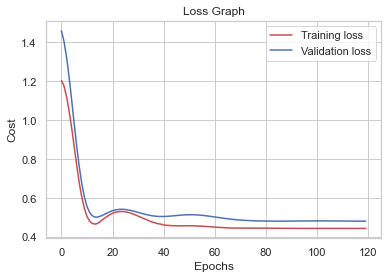

Fold 3


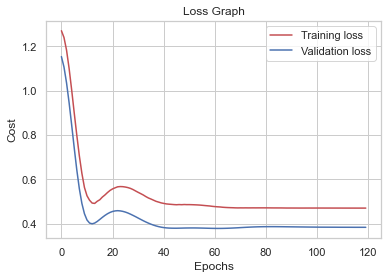

Fold 4


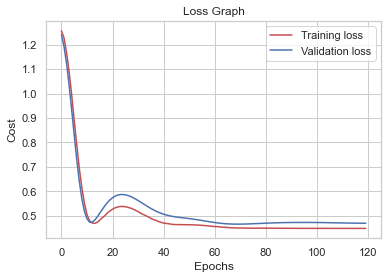

AUC Val: 0.8492342770157053
AUC Train: 0.8561116455690703
Specificity: 0.8853874177017204
Sensitivity: 0.5770760323124364
Positive Predictive Value: 0.7265172714226009
Negative Predictive Value: 0.7913758635977796


In [286]:
repNullPred, aucrepNull, sperepNull, senrepNull, ppvrepNull, npvrepNull, aucTrainRepNull = cross_val('rep_nulls_predictor',replaceNulls=True, nullColumns=['Glucose','BloodPressure','SkinThickness','BMI'])

#### Reemplazando Outliers

Fold 0


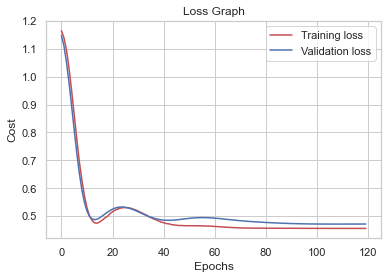

Fold 1


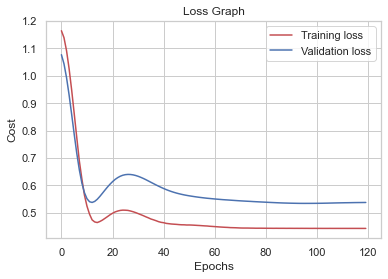

Fold 2


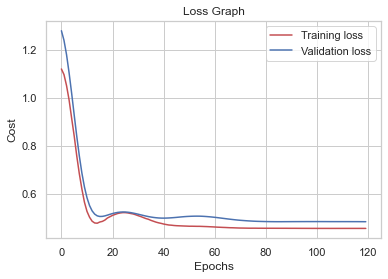

Fold 3


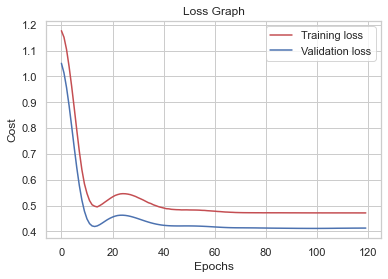

Fold 4


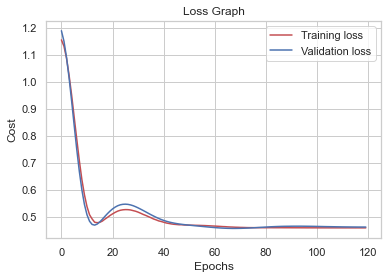

AUC Val: 0.8408857261043352
AUC Train: 0.8496560509507388
Specificity: 0.8859912824345247
Sensitivity: 0.5799267449897844
Positive Predictive Value: 0.7272344592103194
Negative Predictive Value: 0.7935635210790801


(<__main__.DiabetesPredictor at 0x1eb50848af0>,
 0.8408857261043352,
 0.8859912824345247,
 0.5799267449897844,
 0.7272344592103194,
 0.7935635210790801,
 0.8496560509507388)

In [287]:
cross_val('rep_outliers_predictor', replaceOutliers=True, outliersColumnsMap={'BMI': [18.5, 50],'BloodPressure':[40,120],'SkinThickness': [0, np.Infinity], 'Pregnancies': [0, np.Infinity]})

#### Reemplazando Outliers y nulls

Fold 0


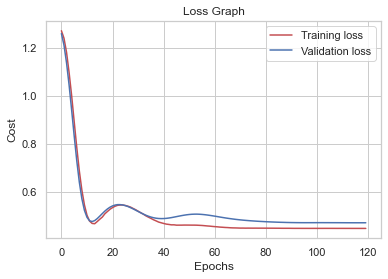

Fold 1


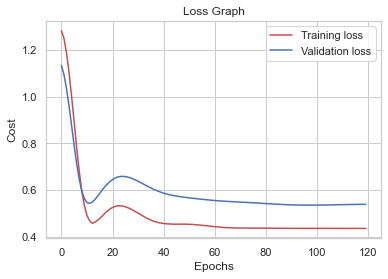

Fold 2


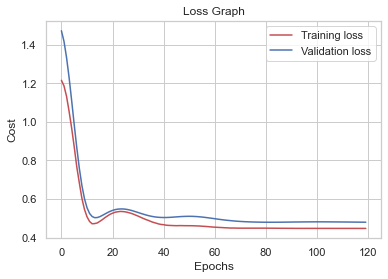

Fold 3


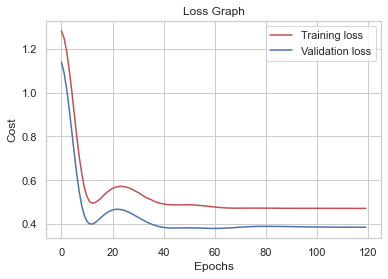

Fold 4


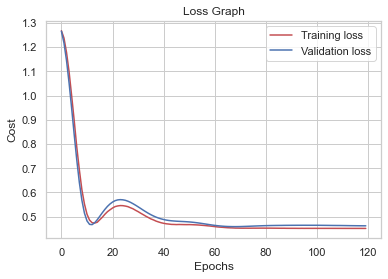

AUC Val: 0.8464799372850355
AUC Train: 0.8539666137776261
Specificity: 0.8813173693965343
Sensitivity: 0.579606076575089
Positive Predictive Value: 0.7198921971948652
Negative Predictive Value: 0.7913048335870763


(<__main__.DiabetesPredictor at 0x1eb408251c0>,
 0.8464799372850355,
 0.8813173693965343,
 0.579606076575089,
 0.7198921971948652,
 0.7913048335870763,
 0.8539666137776261)

In [288]:
cross_val('rep_outliers_nulls_predictor',replaceNulls=True, nullColumns=['Glucose','BloodPressure','SkinThickness','BMI'], replaceOutliers=True, outliersColumnsMap={'BMI': [18.5, 50],'BloodPressure':[40,120],'SkinThickness': [0, np.Infinity], 'Pregnancies': [0, np.Infinity]})

Comparando los resultados anteriores:
- AUC reemplazando nulls: 0.849
- AUC reemplazando outliers y nulls: 0.847
- AUC reemplazando outliers: 0.840

Dado que el valor más alto es reemplazando nulls, continuamos el análisis con este parámetro.

#### Removiendo Columnas

BloodPressure
Fold 0


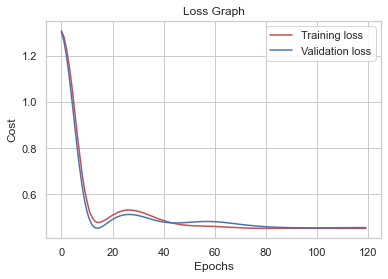

Fold 1


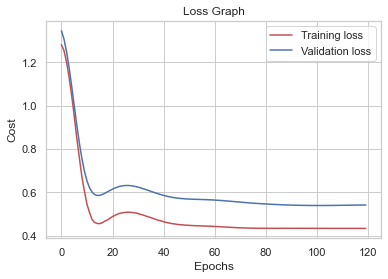

Fold 2


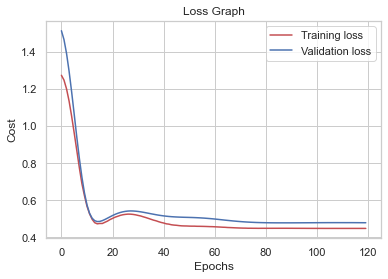

Fold 3


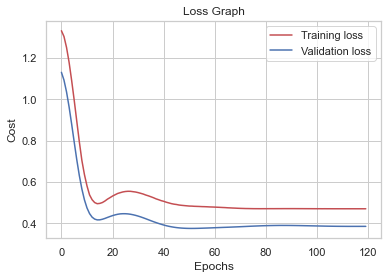

Fold 4


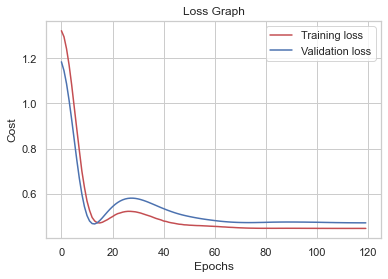

AUC Val: 0.8479150919925266
AUC Train: 0.8558288292777055
Specificity: 0.8884049215024092
Sensitivity: 0.580648763724579
Positive Predictive Value: 0.73242747496045
Negative Predictive Value: 0.7938285865241546
Age
Fold 0


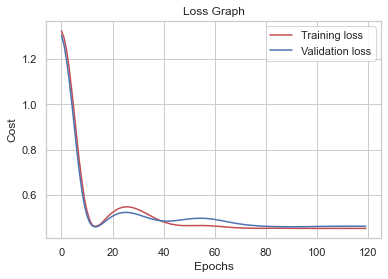

Fold 1


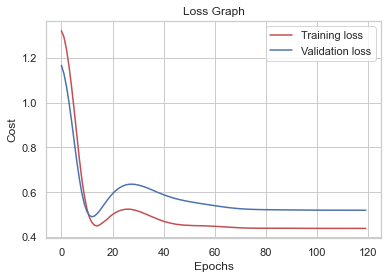

Fold 2


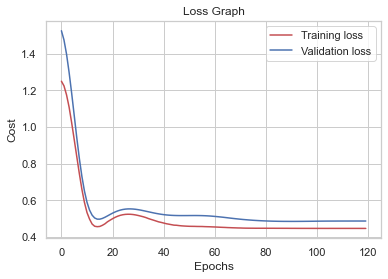

Fold 3


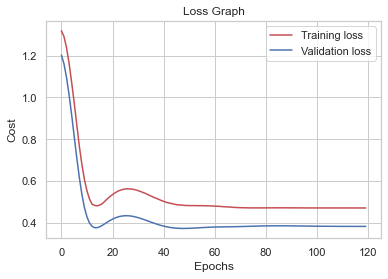

Fold 4


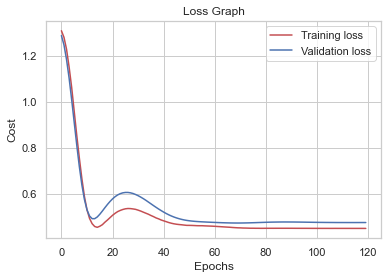

AUC Val: 0.8491262983094231
AUC Train: 0.8547493456980343
Specificity: 0.8832515564108803
Sensitivity: 0.5738764824274696
Positive Predictive Value: 0.7226756709909774
Negative Predictive Value: 0.789401504329662
DiabetesPedigreeFunction
Fold 0


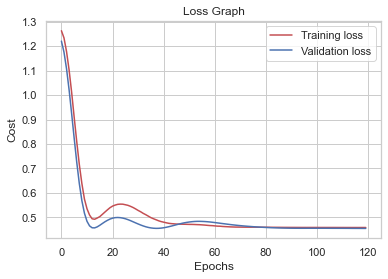

Fold 1


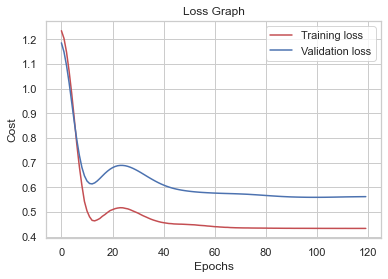

Fold 2


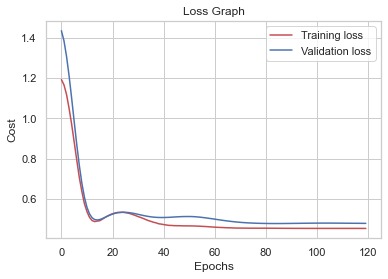

Fold 3


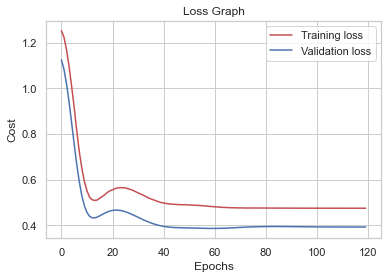

Fold 4


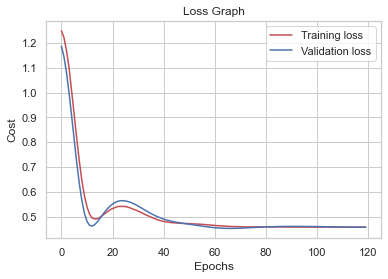

AUC Val: 0.8462080527280946
AUC Train: 0.8503568857281257
Specificity: 0.8759896516577695
Sensitivity: 0.5952923510541355
Positive Predictive Value: 0.7176501990698454
Negative Predictive Value: 0.796723181102801
Pregnancies
Fold 0


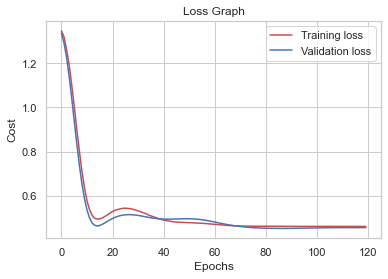

Fold 1


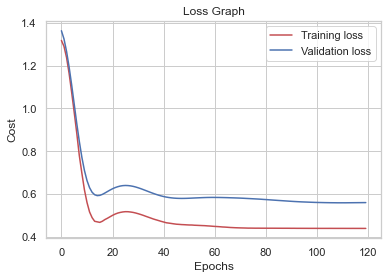

Fold 2


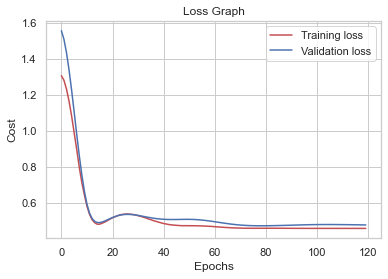

Fold 3


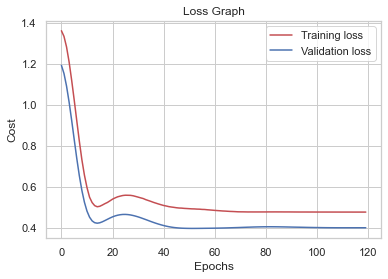

Fold 4


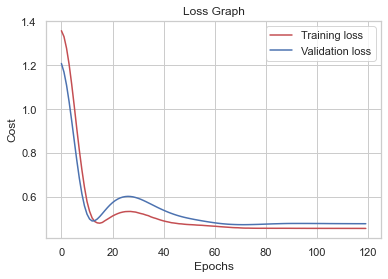

AUC Val: 0.839864349315655
AUC Train: 0.8488334844061788
Specificity: 0.8878874176985952
Sensitivity: 0.5999435138340166
Positive Predictive Value: 0.7383144747562826
Negative Predictive Value: 0.8005805773796123
SkinThickness
Fold 0


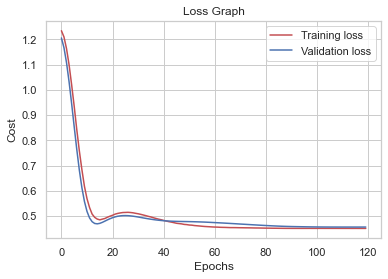

Fold 1


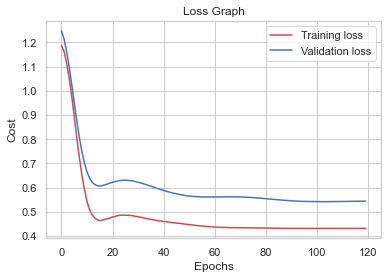

Fold 2


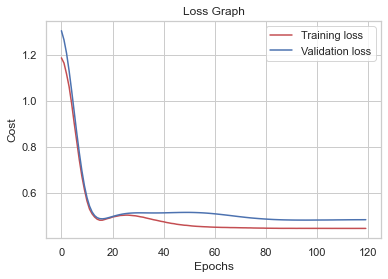

Fold 3


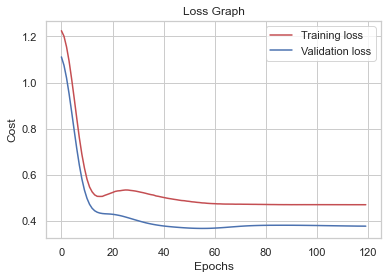

Fold 4


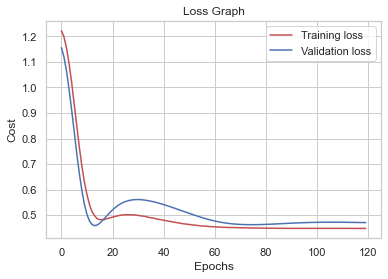

AUC Val: 0.8492015063057468
AUC Train: 0.8562138429459486
Specificity: 0.8807135046637299
Sensitivity: 0.5817271950923175
Positive Predictive Value: 0.7198995938937166
Negative Predictive Value: 0.7924929412785902


In [289]:
bestAuc = aucrepNull
tryRemovingCols = ['BloodPressure', 'Age', 'DiabetesPedigreeFunction', 'Pregnancies', 'SkinThickness']
removeCols = []
removeColsAuc = []
nullCols = ['Glucose','BloodPressure','SkinThickness','BMI']	
		
for col in tryRemovingCols:
	print(col)	
	remColPred, aucremCol, speremCol, senremCol, ppvremCol, npvremCol, aucTrainRemCol = cross_val('rem_col_predictor_' + col ,replaceNulls=True, nullColumns=nullCols, columnsToRemove=[col])
	if (aucremCol > bestAuc):
		removeCols.append(col)
		removeColsAuc.append(aucremCol)

In [290]:
print(removeCols)
print(removeColsAuc)

[]
[]


#### Eliminando todas las columnas que superaron el valor anterior.

Fold 0


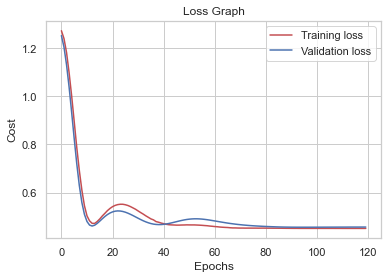

Fold 1


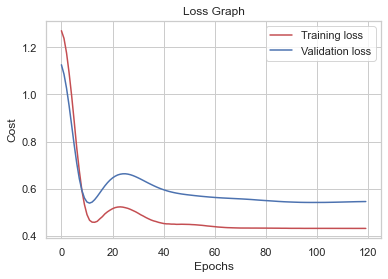

Fold 2


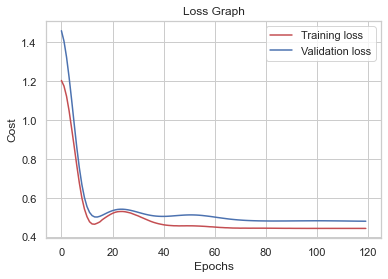

Fold 3


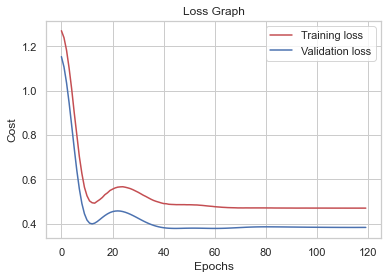

Fold 4


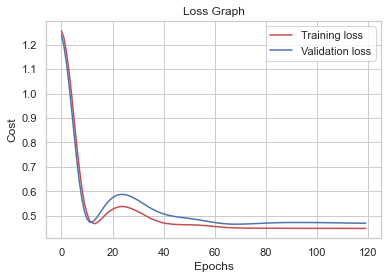

AUC Val: 0.8490320608210805
AUC Train: 0.8561209372940933
Specificity: 0.883213504660605
Sensitivity: 0.5770760323124364
Positive Predictive Value: 0.722216196181995
Negative Predictive Value: 0.7911187340962317


(<__main__.DiabetesPredictor at 0x1eb5544fbe0>,
 0.8490320608210805,
 0.883213504660605,
 0.5770760323124364,
 0.722216196181995,
 0.7911187340962317,
 0.8561209372940933)

In [292]:
cross_val('rem_cols_predictor' ,replaceNulls=True, nullColumns=['Glucose','BloodPressure','SkinThickness','BMI'], columnsToRemove=removeCols)

1
Fold 0


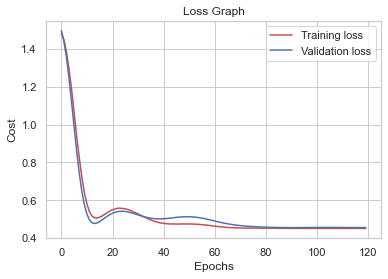

Fold 1


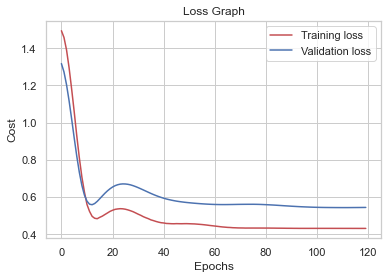

Fold 2


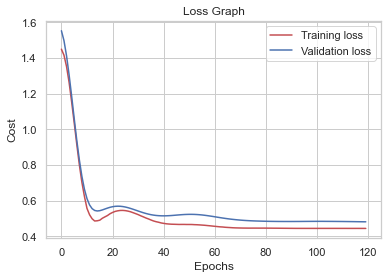

Fold 3


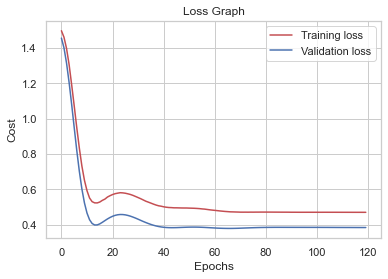

Fold 4


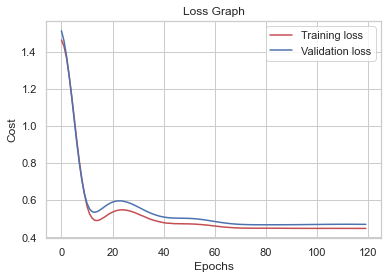

AUC Val: 0.8490147659905407
AUC Train: 0.8561488627370604
Specificity: 0.883213504660605
Sensitivity: 0.5835276451948507
Positive Predictive Value: 0.7244339381235557
Negative Predictive Value: 0.793053755592241
2
Fold 0


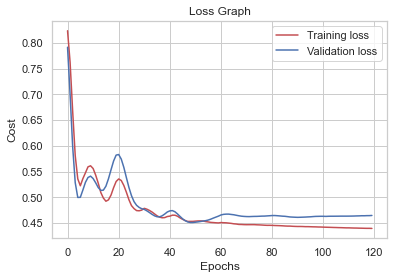

Fold 1


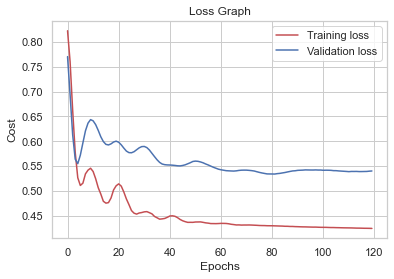

Fold 2


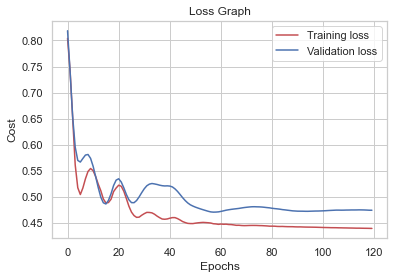

Fold 3


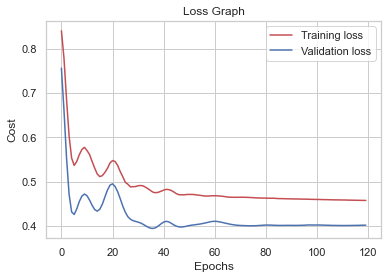

Fold 4


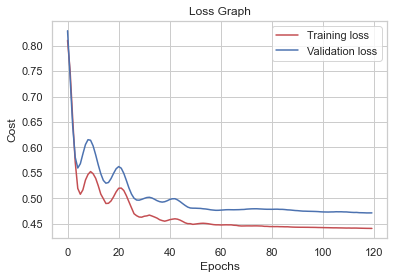

AUC Val: 0.848637588880111
AUC Train: 0.8660561127911934
Specificity: 0.8913516868630559
Sensitivity: 0.5777379625094262
Positive Predictive Value: 0.7354078579250833
Negative Predictive Value: 0.7941359646368378
3
Fold 0


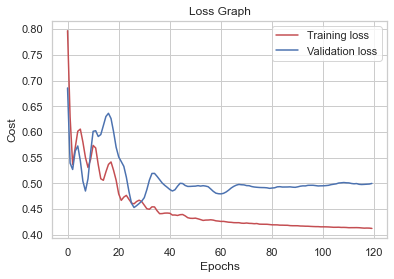

Fold 1


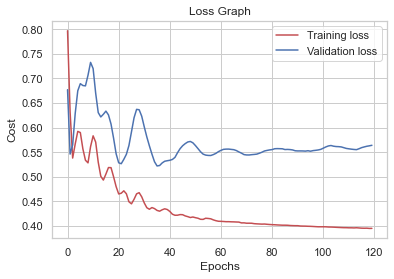

Fold 2


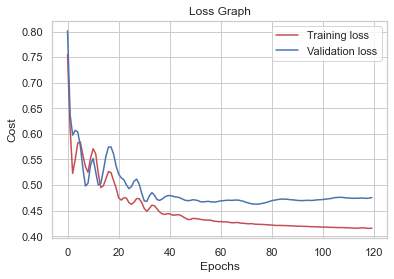

Fold 3


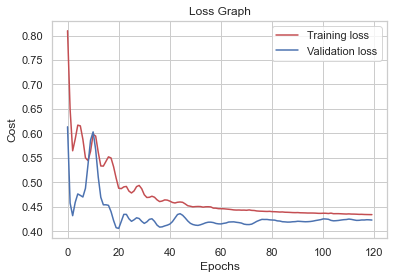

Fold 4


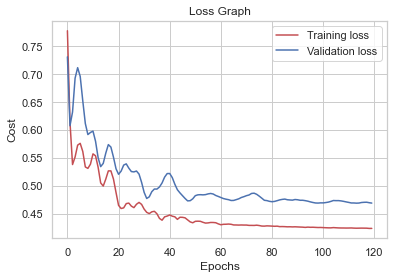

AUC Val: 0.8417422353541488
AUC Train: 0.8797892291339015
Specificity: 0.8682205005292841
Sensitivity: 0.5799191695644597
Positive Predictive Value: 0.6987027217235211
Negative Predictive Value: 0.7900337584466184
4
Fold 0


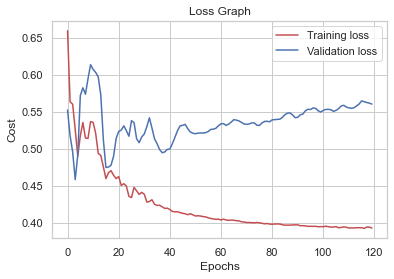

Fold 1


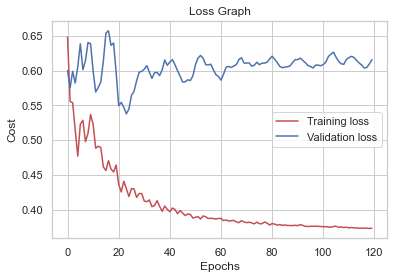

Fold 2


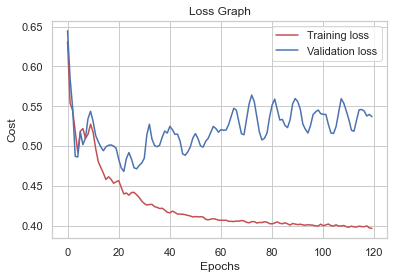

Fold 3


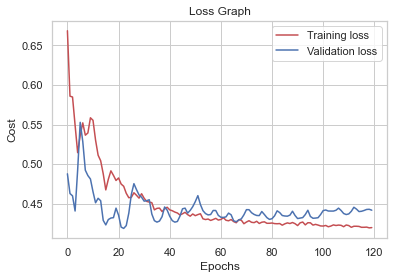

Fold 4


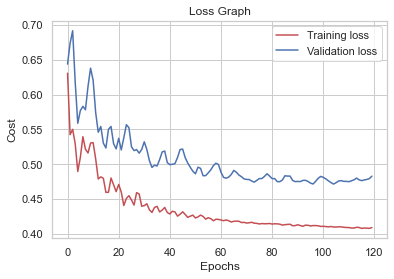

AUC Val: 0.823467577794885
AUC Train: 0.8888051368930338
Specificity: 0.8355811271718239
Sensitivity: 0.578559564952232
Positive Predictive Value: 0.6496846829649788
Negative Predictive Value: 0.7822919628461757


In [293]:
aucPolys = []
for i in range(1,5):
    print(i)
    polyPred, aucPoly, spePoly, senPoly, ppvPoly, npvPoly, aucTrainPoly = cross_val('featPol' + str(i) + '_' ,replaceNulls=True, nullColumns=['Glucose','BloodPressure','SkinThickness','BMI'], columnsToRemove=removeCols, polyFeatDeg=i)
    aucPolys.append(aucPoly)

bestPolDeg = aucPolys.index(max(aucPolys)) + 1

In [294]:
print(aucPolys)

[0.8490147659905407, 0.848637588880111, 0.8417422353541488, 0.823467577794885]


In [295]:
print('Best Degree: ' + str(bestPolDeg) + " --- AUC: " + str(max(aucPolys)))

Best Degree: 1 --- AUC: 0.8490147659905407


#### Vuelvo a probar con EarlyStopping (había overfitting)

1
Fold 0


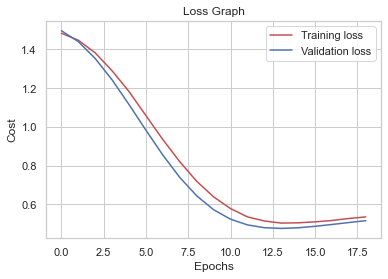

Fold 1


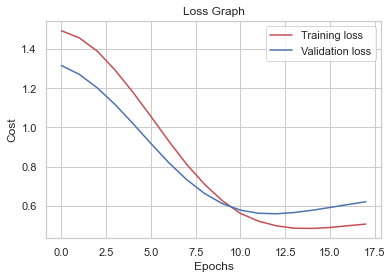

Fold 2


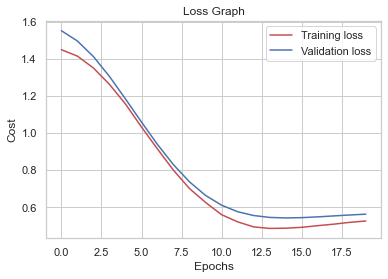

Fold 3


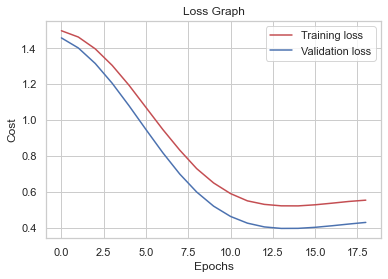

Fold 4


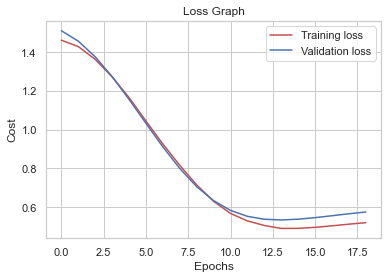

AUC Val: 0.8322228455053462
AUC Train: 0.8324437772324252
Specificity: 0.7830297455577743
Sensitivity: 0.6739381152374486
Positive Predictive Value: 0.6225016429915096
Negative Predictive Value: 0.810714545688081
2
Fold 0


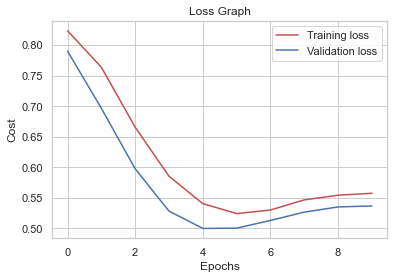

Fold 1


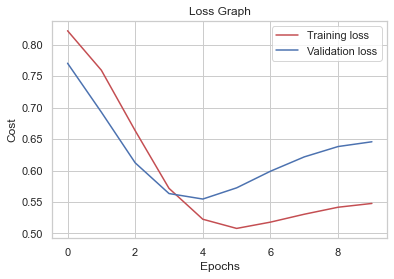

Fold 2


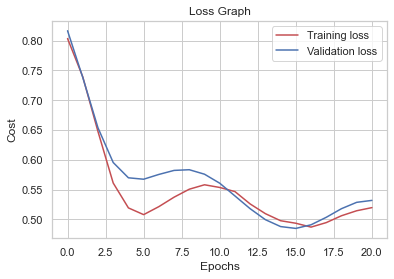

Fold 3


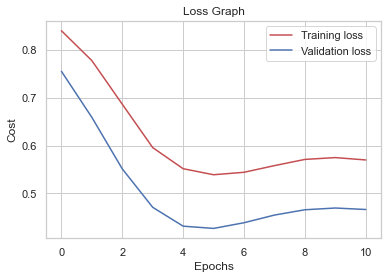

Fold 4


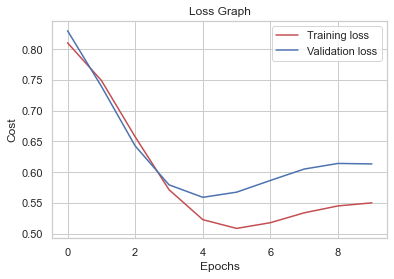

AUC Val: 0.833063766293938
AUC Train: 0.8299243236213844
Specificity: 0.8165631223353568
Sensitivity: 0.6550522908734352
Positive Predictive Value: 0.6564542660621372
Negative Predictive Value: 0.8082083393670094
3
Fold 0


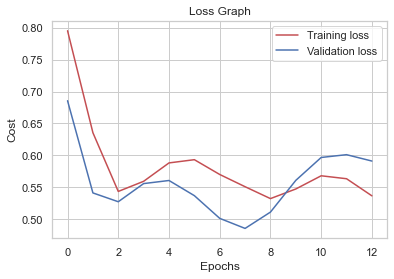

Fold 1


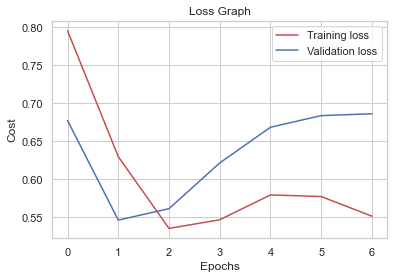

Fold 2


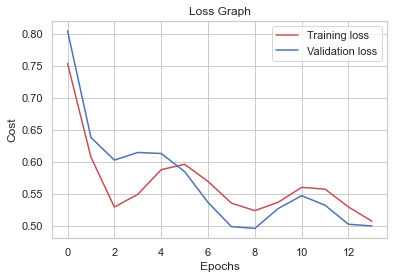

Fold 3


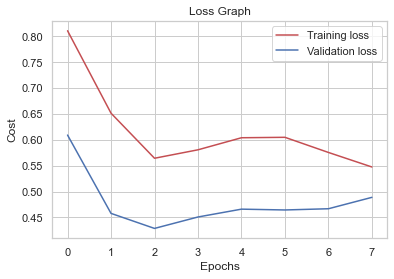

Fold 4


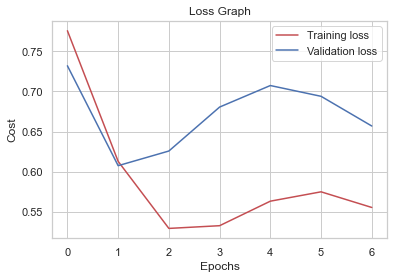

AUC Val: 0.8160266901947366
AUC Train: 0.8372209693994108
Specificity: 0.8462506488901618
Sensitivity: 0.582413469608864
Positive Predictive Value: 0.6728530814138715
Negative Predictive Value: 0.7864382904000284
4
Fold 0


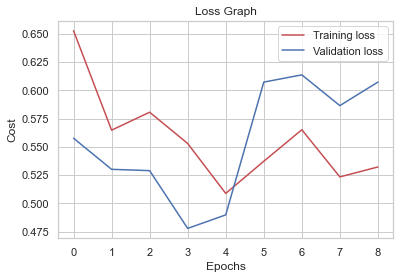

Fold 1


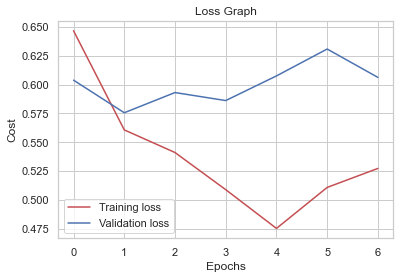

Fold 2


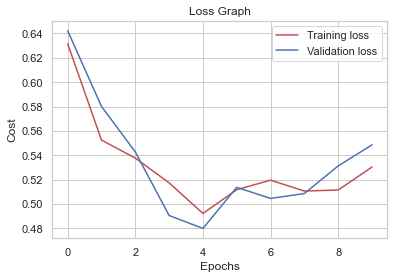

Fold 3


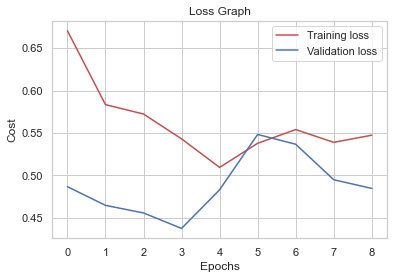

Fold 4


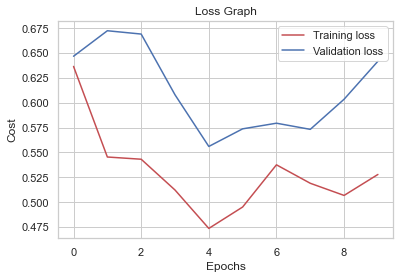

AUC Val: 0.8364669927028061
AUC Train: 0.8451053667715405
Specificity: 0.859159362488033
Sensitivity: 0.6155940440948149
Positive Predictive Value: 0.6998154987536559
Negative Predictive Value: 0.8039316354181836
5
Fold 0


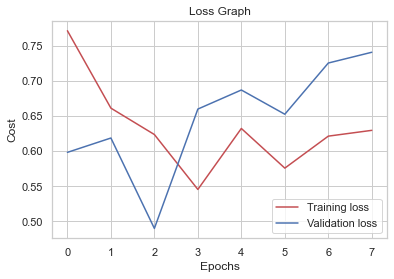

Fold 1


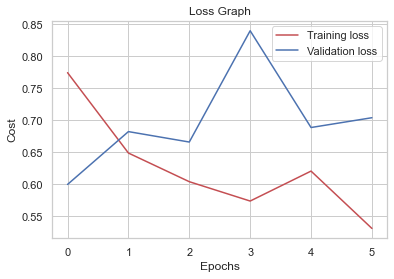

Fold 2


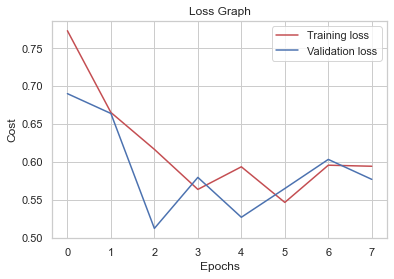

Fold 3


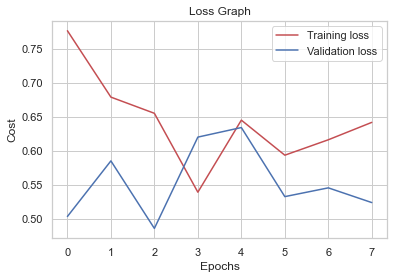

Fold 4


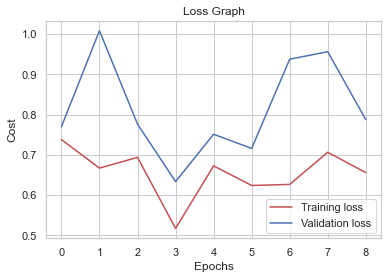

AUC Val: 0.8298013688360758
AUC Train: 0.846758836892102
Specificity: 0.8577172720561638
Sensitivity: 0.6080997440629105
Positive Predictive Value: 0.7019548043826485
Negative Predictive Value: 0.7989519933704906
6
Fold 0


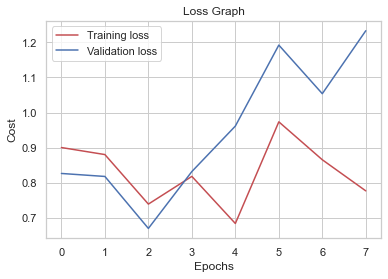

Fold 1


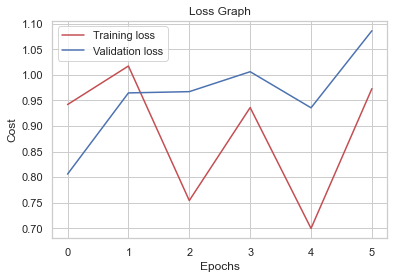

Fold 2


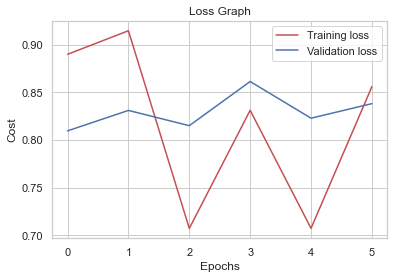

Fold 3


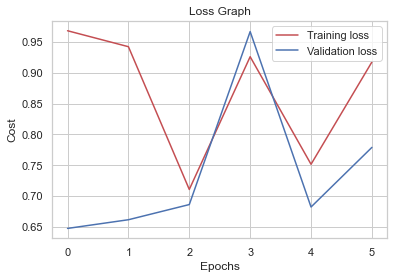

Fold 4


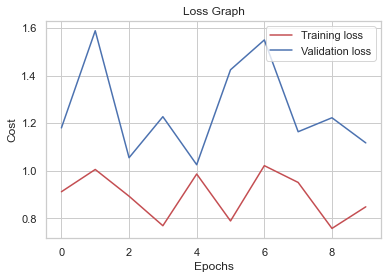

AUC Val: 0.757139319168473
AUC Train: 0.8019160638964541
Specificity: 0.831105437754432
Sensitivity: 0.5605810998114494
Positive Predictive Value: 0.6443620662181795
Negative Predictive Value: 0.7755932334189446


In [298]:
aucEarlyPolys = []
for i in range(1,6):
    print(i)
    polyPred, aucPoly, spePoly, senPoly, ppvPoly, npvPoly, aucTrainPoly = cross_val('featPolEarly' + str(i) + '_' ,replaceNulls=True, nullColumns=['Glucose','BloodPressure','SkinThickness','BMI'], columnsToRemove=removeCols, polyFeatDeg=i, earlyStop=True)
    aucEarlyPolys.append(aucPoly)

bestPolDeg = aucEarlyPolys.index(max(aucEarlyPolys)) + 1

In [299]:
print('Best Degree: ' + str(bestPolDeg) + " --- AUC: " + str(max(aucPolys)))

Best Degree: 4 --- AUC: 0.8490147659905407


#### Con reg L1

1
Fold 0


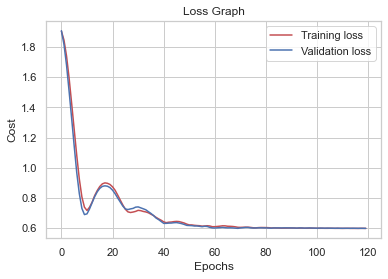

Fold 1


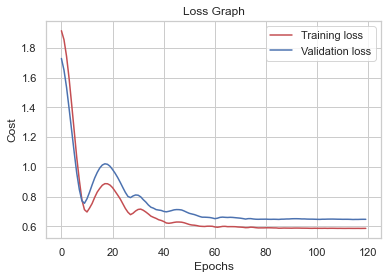

Fold 2


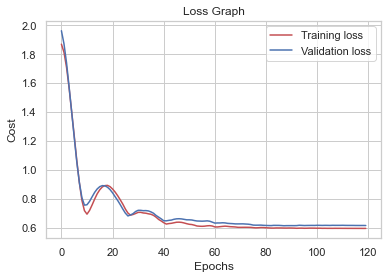

Fold 3


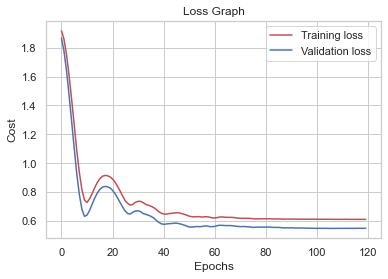

Fold 4


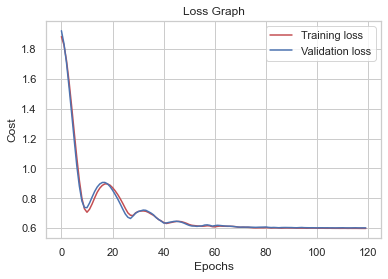

AUC Val: 0.8147384651225371
AUC Train: 0.8191300643689632
Specificity: 0.9435062430813037
Sensitivity: 0.38661150488518425
Positive Predictive Value: 0.7901282012574663
Negative Predictive Value: 0.7392763331618291
2
Fold 0


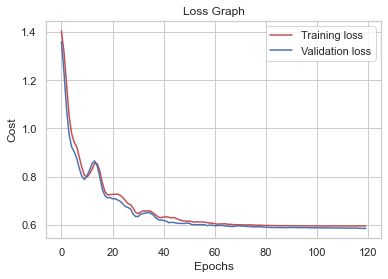

Fold 1


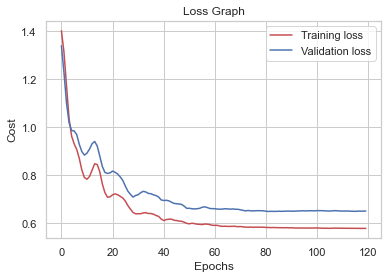

Fold 2


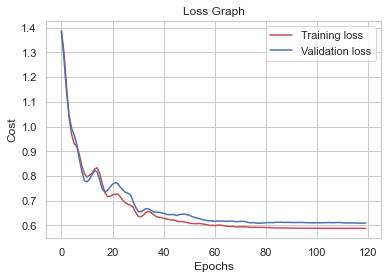

Fold 3


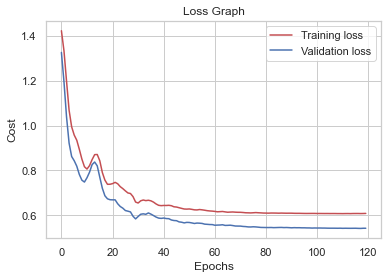

Fold 4


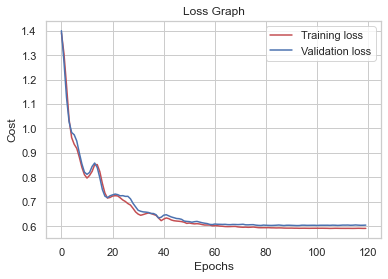

AUC Val: 0.833385982557062
AUC Train: 0.839915602959832
Specificity: 0.9381941478314874
Sensitivity: 0.4219413666812871
Positive Predictive Value: 0.7827178635043699
Negative Predictive Value: 0.7495495698204919
3
Fold 0


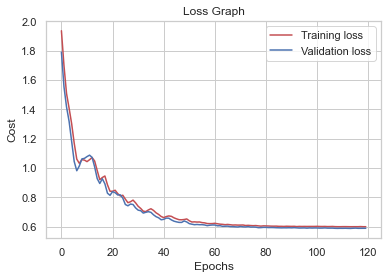

Fold 1


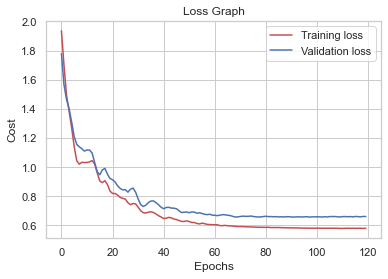

Fold 2


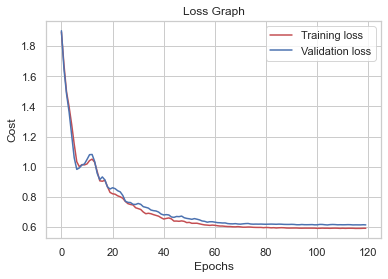

Fold 3


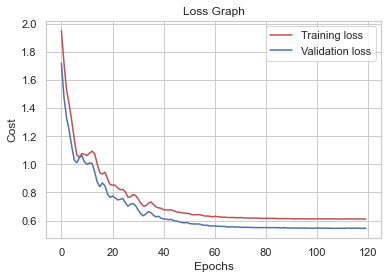

Fold 4


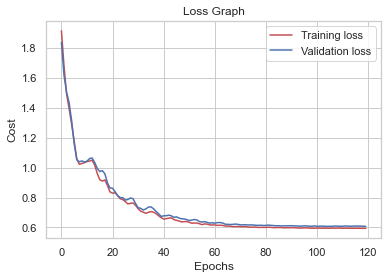

AUC Val: 0.8389520979286633
AUC Train: 0.8471690754175484
Specificity: 0.9385909732272892
Sensitivity: 0.42589867951929705
Positive Predictive Value: 0.7824520952454787
Negative Predictive Value: 0.7501322460896735
4
Fold 0


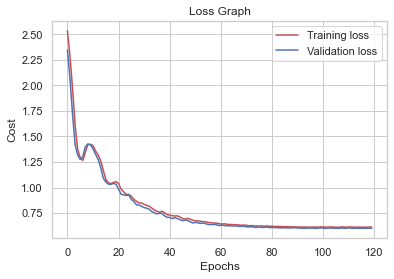

Fold 1


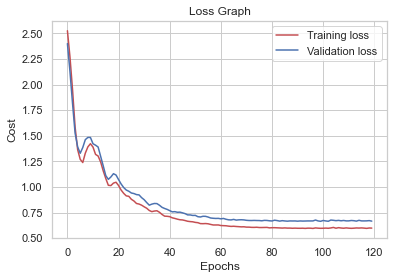

Fold 2


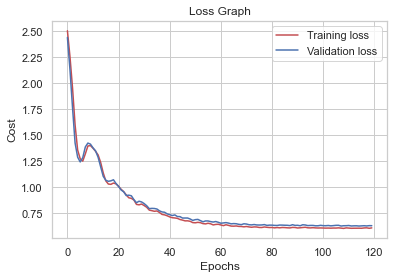

Fold 3


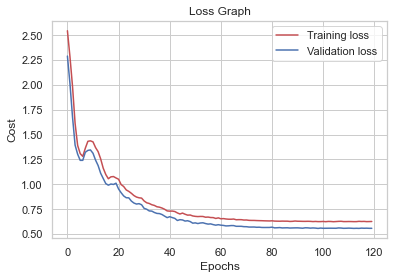

Fold 4


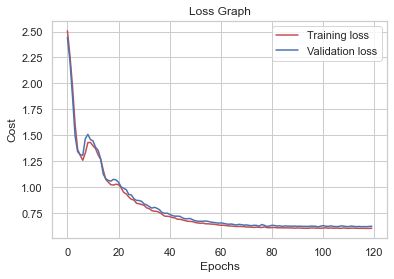

AUC Val: 0.8455662262801408
AUC Train: 0.8497099404313969
Specificity: 0.9308131954596195
Sensitivity: 0.4695200994705532
Positive Predictive Value: 0.7797888168218388
Negative Predictive Value: 0.7623577279231647
5
Fold 0


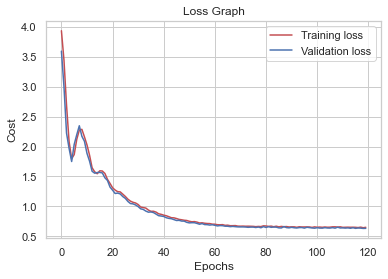

Fold 1


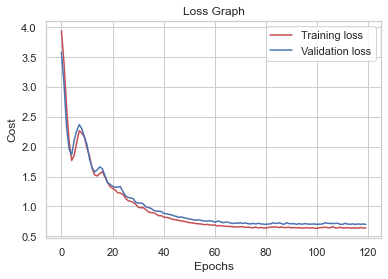

Fold 2


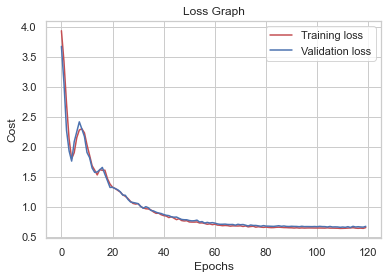

Fold 3


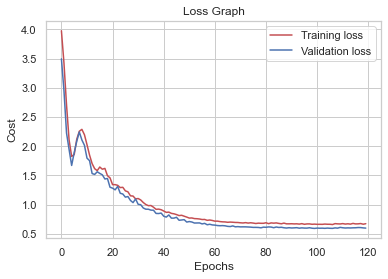

Fold 4


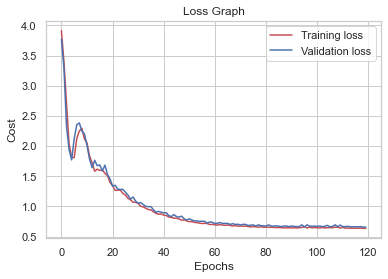

AUC Val: 0.8445939196099198
AUC Train: 0.8506926976242177
Specificity: 0.935280069160607
Sensitivity: 0.4412193478964923
Positive Predictive Value: 0.7781583413464375
Negative Predictive Value: 0.7552075892680148
6
Fold 0


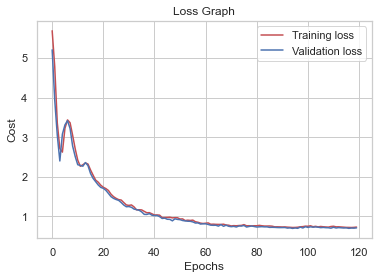

Fold 1


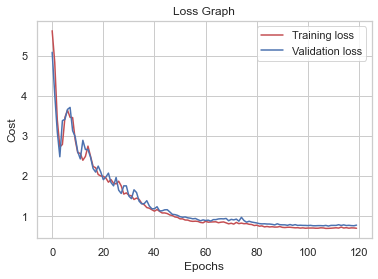

Fold 2


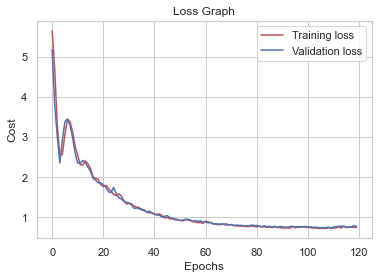

Fold 3


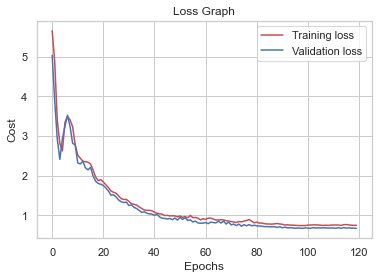

Fold 4


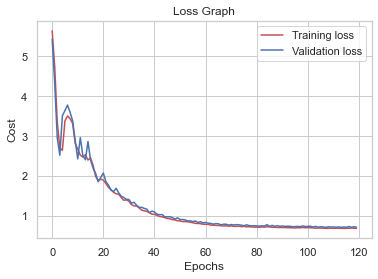

AUC Val: 0.8345755362009335
AUC Train: 0.8450929195278676
Specificity: 0.9196848310857371
Sensitivity: 0.4166001049114928
Positive Predictive Value: 0.7313538867278558
Negative Predictive Value: 0.7443838239936966
7
Fold 0


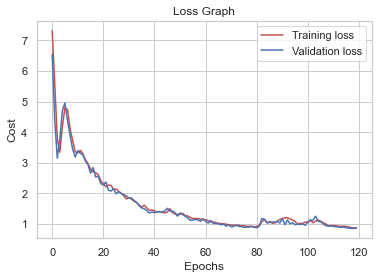

Fold 1


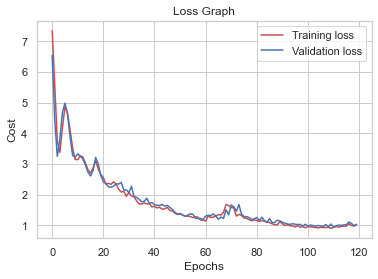

Fold 2


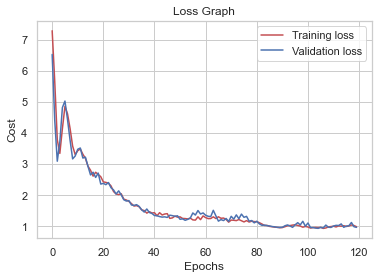

Fold 3


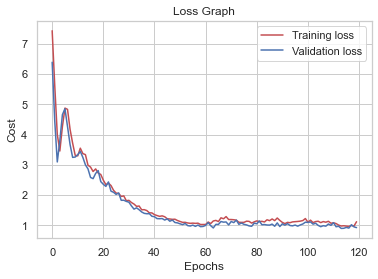

Fold 4


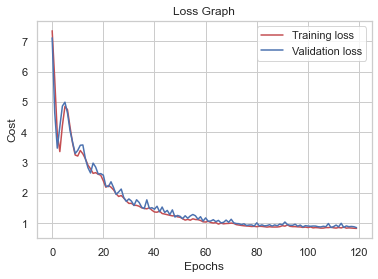

AUC Val: 0.8209868195052292
AUC Train: 0.8437070200886252
Specificity: 0.9379887392837398
Sensitivity: 0.37408146064753167
Positive Predictive Value: 0.7691729284713447
Negative Predictive Value: 0.7350756829310051


In [309]:
aucReguPolys = []
for i in range(1,8):
    print(i)
    polyPred, aucPoly, spePoly, senPoly, ppvPoly, npvPoly, aucTrainPoly = cross_val('featPolEarly' + str(i) + '_' ,replaceNulls=True, nullColumns=['Glucose','BloodPressure','SkinThickness','BMI'], columnsToRemove=removeCols, polyFeatDeg=i, regu='l1')
    aucReguPolys.append(aucPoly)

bestPolReguL1Deg = aucReguPolys.index(max(aucReguPolys)) + 1

In [310]:
print('Best Degree: ' + str(bestPolReguL1Deg) + " --- AUC: " + str(max(aucReguPolys)))

Best Degree: 4 --- AUC: 0.8455662262801408


#### Con reg L2

1
Fold 0


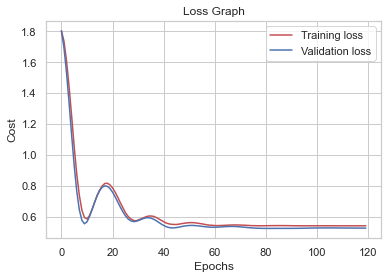

Fold 1


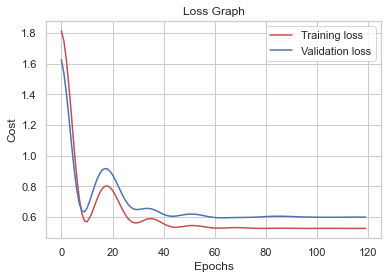

Fold 2


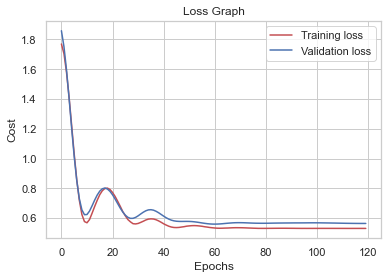

Fold 3


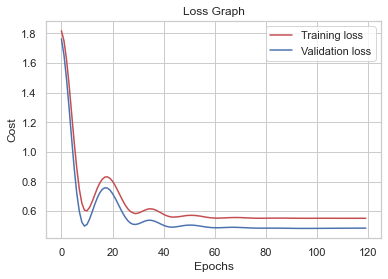

Fold 4


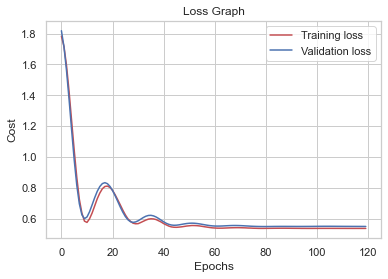

AUC Val: 0.845099457600841
AUC Train: 0.8496849451969917
Specificity: 0.9085979691147186
Sensitivity: 0.48382242501781525
Positive Predictive Value: 0.7350549424271565
Negative Predictive Value: 0.7628134199322831
2
Fold 0


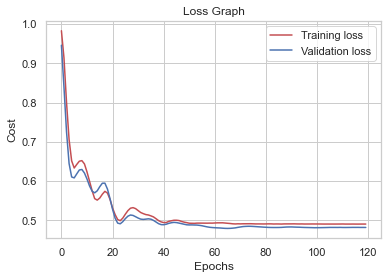

Fold 1


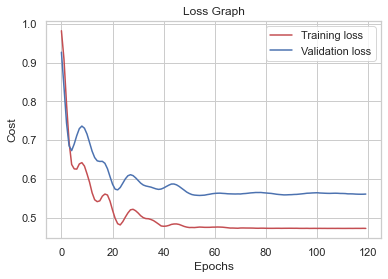

Fold 2


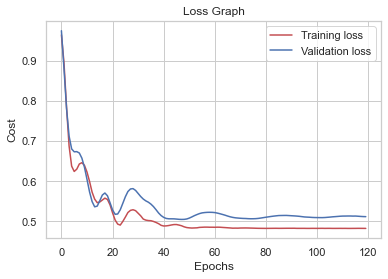

Fold 3


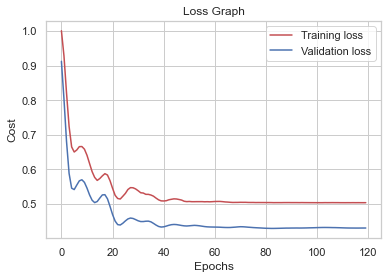

Fold 4


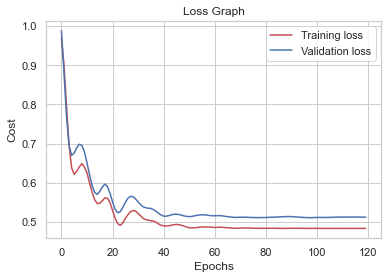

AUC Val: 0.8492119603799271
AUC Train: 0.8553618258536144
Specificity: 0.8935255999041714
Sensitivity: 0.5477493624831176
Positive Predictive Value: 0.729329935025603
Negative Predictive Value: 0.7825909275910039
3
Fold 0


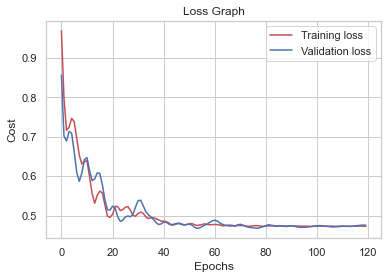

Fold 1


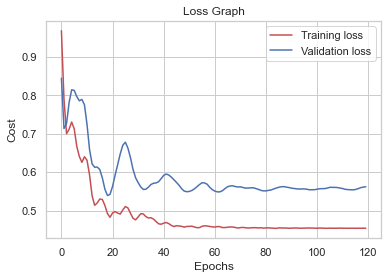

Fold 2


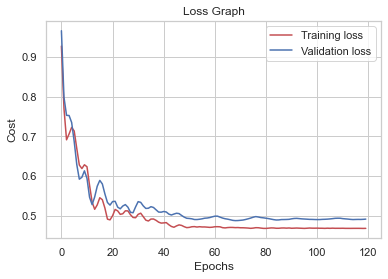

Fold 3


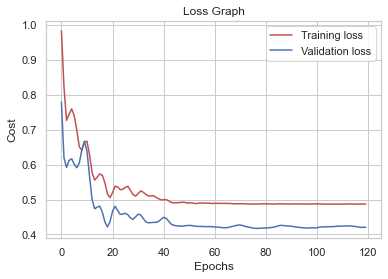

Fold 4


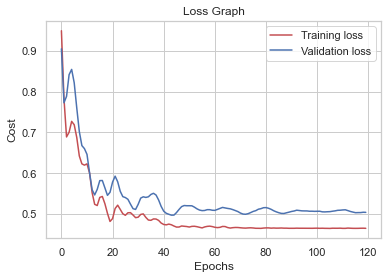

AUC Val: 0.8504223973963537
AUC Train: 0.8624231840137402
Specificity: 0.8938897386102067
Sensitivity: 0.5477493624831176
Positive Predictive Value: 0.7299754879155491
Negative Predictive Value: 0.7827559513110481
4
Fold 0


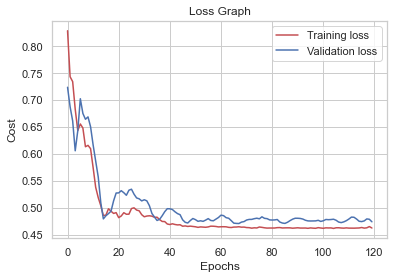

Fold 1


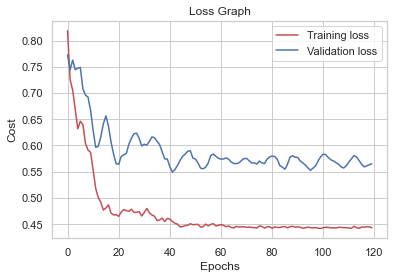

Fold 2


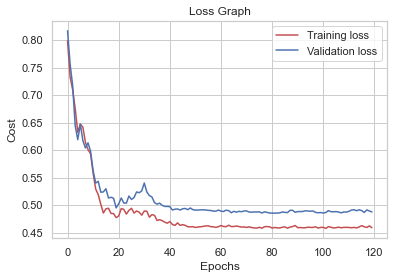

Fold 3


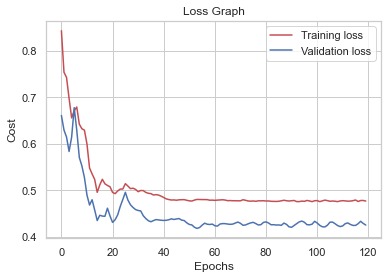

Fold 4


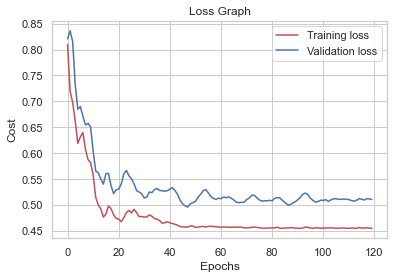

AUC Val: 0.8503927348742396
AUC Train: 0.869244293709184
Specificity: 0.9013033776718411
Sensitivity: 0.5466785065407039
Positive Predictive Value: 0.7427759716611753
Negative Predictive Value: 0.7842077314105819
5
Fold 0


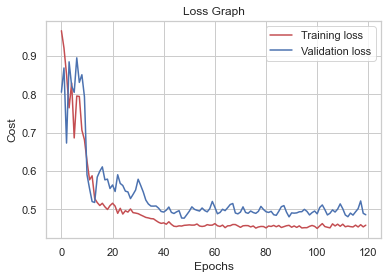

Fold 1


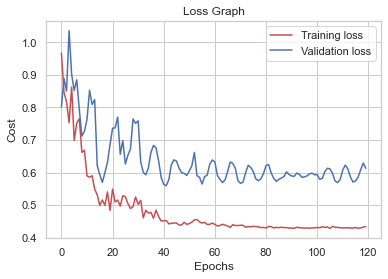

Fold 2


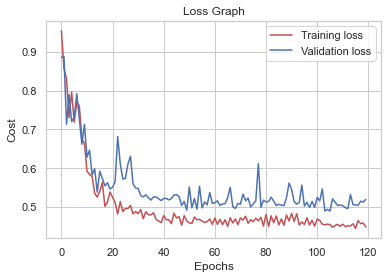

Fold 3


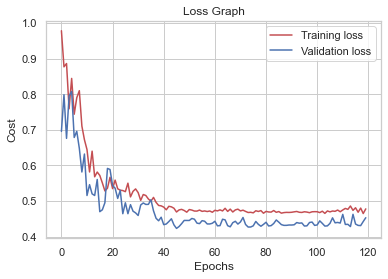

Fold 4


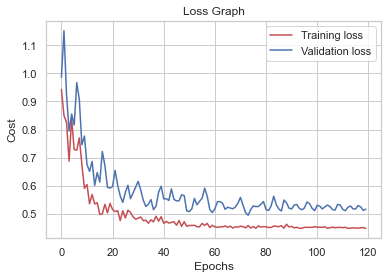

AUC Val: 0.8355872823789822
AUC Train: 0.8711198199059428
Specificity: 0.8858222948477976
Sensitivity: 0.5466541622211472
Positive Predictive Value: 0.713580991897875
Negative Predictive Value: 0.7817965774407278


In [311]:
aucRegu2Polys = []
for i in range(1,6):
    print(i)
    polyPred, aucPoly, spePoly, senPoly, ppvPoly, npvPoly, aucTrainPoly = cross_val('featPolEarly' + str(i) + '_' ,replaceNulls=True, nullColumns=['Glucose','BloodPressure','SkinThickness','BMI'], columnsToRemove=removeCols, polyFeatDeg=i, regu='l2')
    aucRegu2Polys.append(aucPoly)

bestPolReguL2Deg = aucRegu2Polys.index(max(aucRegu2Polys)) + 1

In [312]:
print('Best Degree: ' + str(bestPolReguL2Deg) + " --- AUC: " + str(max(aucRegu2Polys)))

Best Degree: 3 --- AUC: 0.8504223973963537


#### Con DropOut

Fold 0


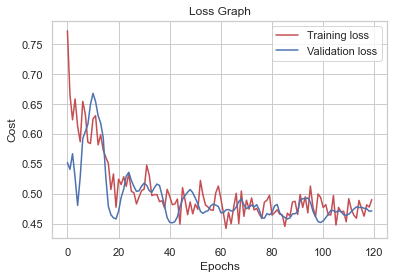

Fold 1


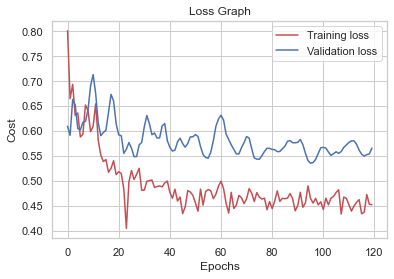

Fold 2


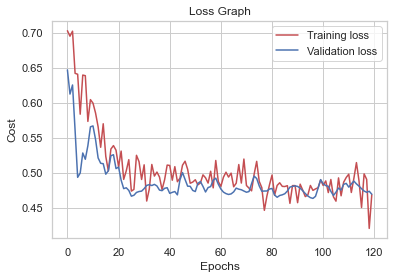

Fold 3


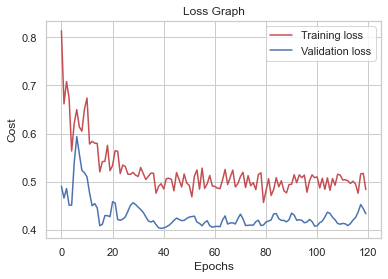

Fold 4


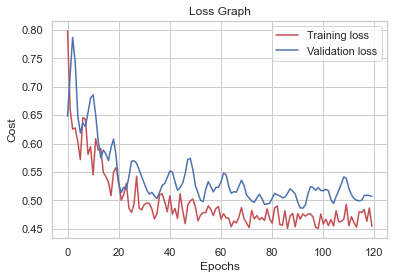

AUC Val: 0.8437925566684733
AUC Train: 0.8700670146674196
Specificity: 0.8859966474950337
Sensitivity: 0.5752680067845787
Positive Predictive Value: 0.7284236575054162
Negative Predictive Value: 0.7912859538561376


(<__main__.DiabetesPredictor at 0x1eb44c9a910>,
 0.8437925566684733,
 0.8859966474950337,
 0.5752680067845787,
 0.7284236575054162,
 0.7912859538561376,
 0.8700670146674196)

In [313]:
cross_val('dropOut' ,replaceNulls=True, nullColumns=['Glucose','BloodPressure','SkinThickness','BMI'], columnsToRemove=removeCols, polyFeatDeg=4, dropOut=True)

#### Con Batch Normalization

Fold 0


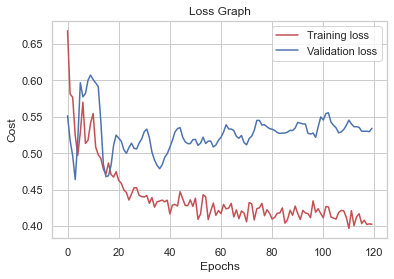

Fold 1


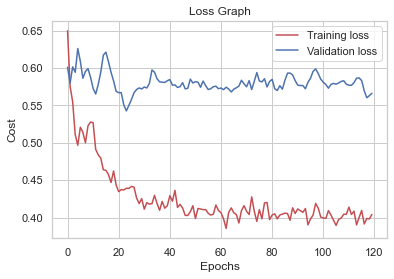

Fold 2


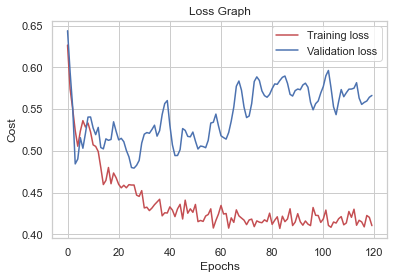

Fold 3


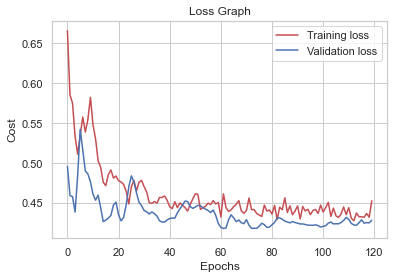

Fold 4


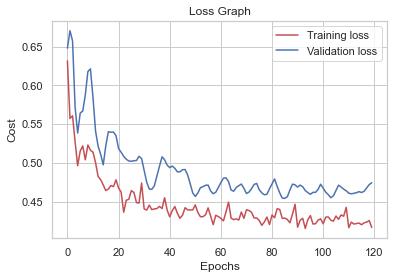

AUC Val: 0.834773687918761
AUC Train: 0.8826426051386163
Specificity: 0.8502013659580904
Sensitivity: 0.5878299707671127
Positive Predictive Value: 0.6758520740185817
Negative Predictive Value: 0.7882565730358986


(<__main__.DiabetesPredictor at 0x1eb553839d0>,
 0.834773687918761,
 0.8502013659580904,
 0.5878299707671127,
 0.6758520740185817,
 0.7882565730358986,
 0.8826426051386163)

In [314]:
cross_val("batch",replaceNulls=True, nullColumns=['Glucose','BloodPressure','SkinThickness','BMI'], columnsToRemove=removeCols,  polyFeatDeg=4,batchNormalization=True)

Entre EarlyStopping, DropOut y regularizadores, los mejores resultados se obtuvieron con regularizadores.

Aunque no se obtuvieron mejoras utilizando featuresPolinomiales y regularización, estos se utilizarán en los próximos análisis a fin de evitar overfitting.

Fold 0


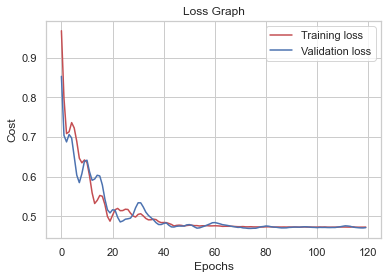

Fold 1


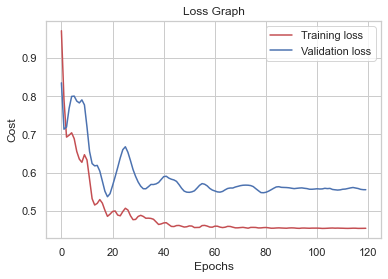

Fold 2


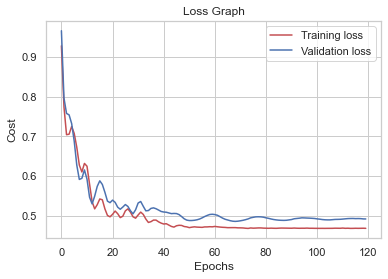

Fold 3


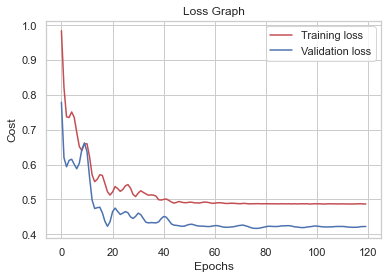

Fold 4


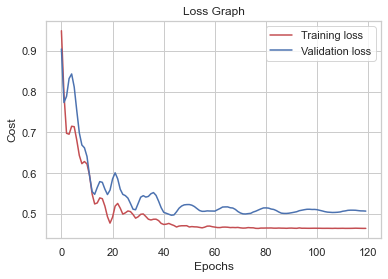

AUC Val: 0.850230108253578
AUC Train: 0.8625480065547706
Specificity: 0.890785873880527
Sensitivity: 0.543827793863356
Positive Predictive Value: 0.7239266373563938
Negative Predictive Value: 0.7803198653225186


(<__main__.DiabetesPredictor at 0x1eb4cafeb50>,
 0.850230108253578,
 0.890785873880527,
 0.543827793863356,
 0.7239266373563938,
 0.7803198653225186,
 0.8625480065547706)

In [316]:
cross_val('l2' ,replaceNulls=True, nullColumns=['Glucose','BloodPressure','SkinThickness','BMI'], columnsToRemove=removeCols,polyFeatDeg=bestPolReguL2Deg, regu="l2")

### Variación del learning rate

1e-05
Fold 0


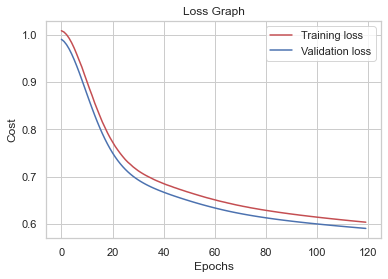

Fold 1


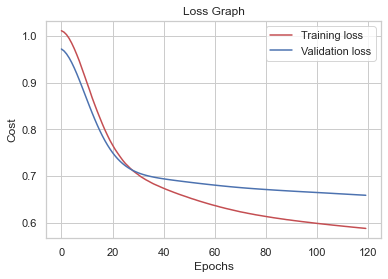

Fold 2


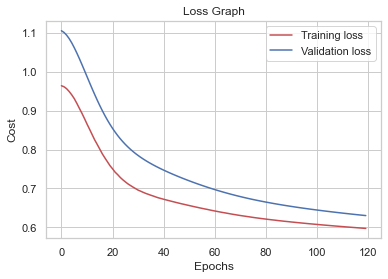

Fold 3


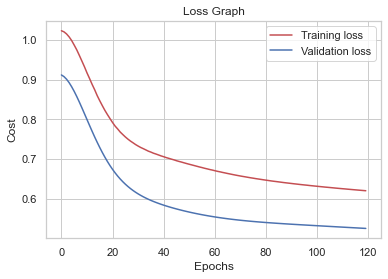

Fold 4


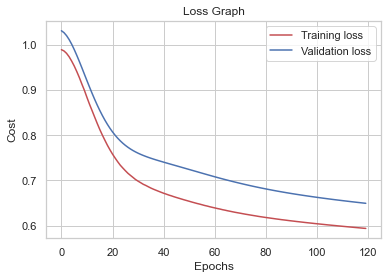

AUC Val: 0.8412709136399183
AUC Train: 0.847258762511642
Specificity: 0.885834183065492
Sensitivity: 0.5412620053824553
Positive Predictive Value: 0.7119607821280087
Negative Predictive Value: 0.7807013254405234
0.0001
Fold 0


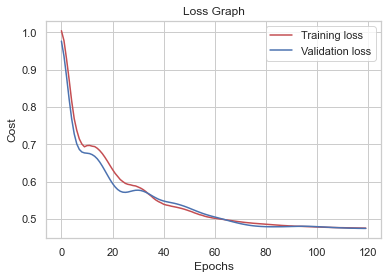

Fold 1


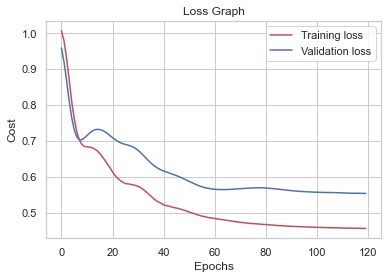

Fold 2


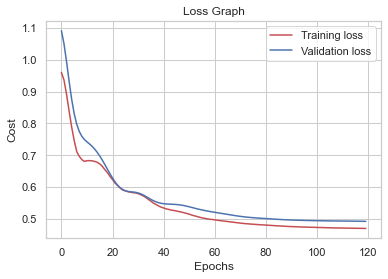

Fold 3


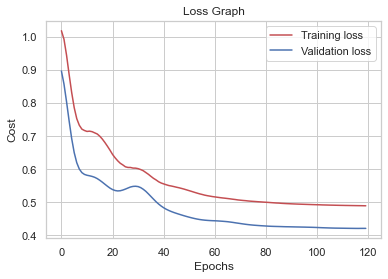

Fold 4


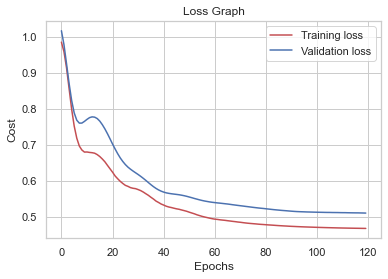

AUC Val: 0.8515340311020625
AUC Train: 0.8622239935564361
Specificity: 0.890785873880527
Sensitivity: 0.5516709311028792
Positive Predictive Value: 0.7257648726761252
Negative Predictive Value: 0.783628915815226
0.001
Fold 0


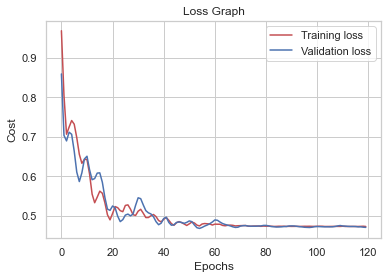

Fold 1


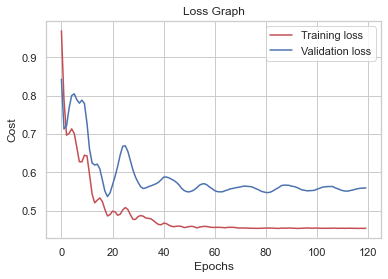

Fold 2


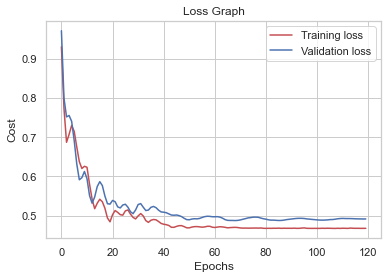

Fold 3


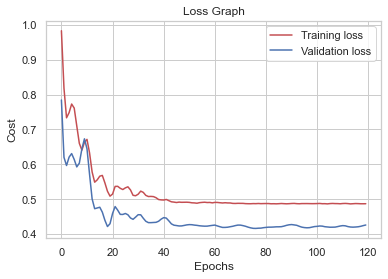

Fold 4


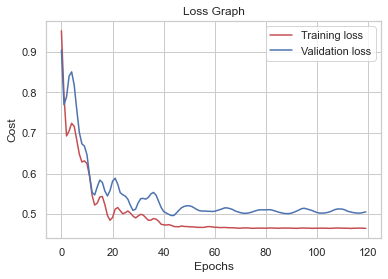

AUC Val: 0.8488039792120459
AUC Train: 0.8622144723206278
Specificity: 0.8908239256308026
Sensitivity: 0.5516709311028792
Positive Predictive Value: 0.7267325324608084
Negative Predictive Value: 0.7835290406593943
0.01
Fold 0


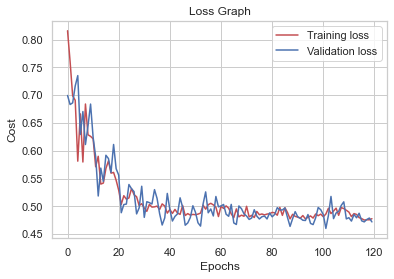

Fold 1


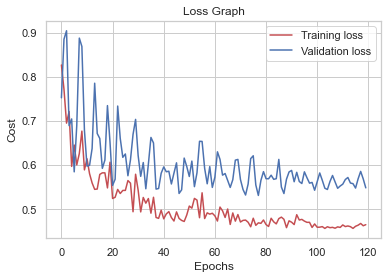

Fold 2


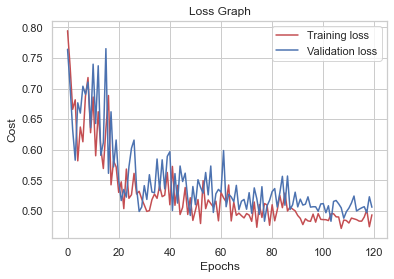

Fold 3


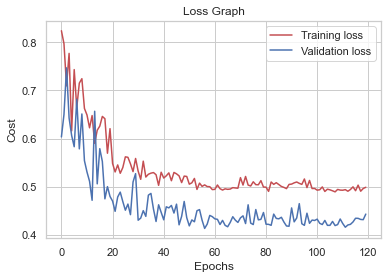

Fold 4


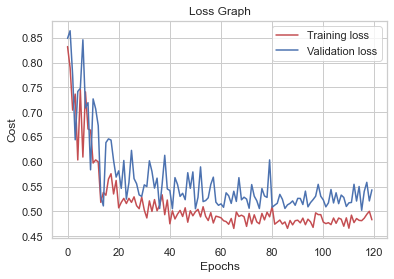

AUC Val: 0.8275179907205343
AUC Train: 0.8508663913072378
Specificity: 0.9058185605515436
Sensitivity: 0.5141203670815369
Positive Predictive Value: 0.7402503268388257
Negative Predictive Value: 0.7737472651931376
0.1
Fold 0


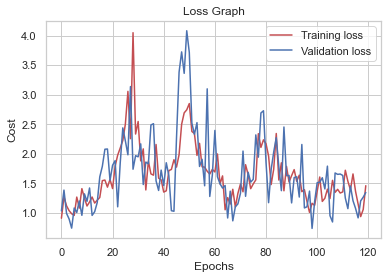

Fold 1


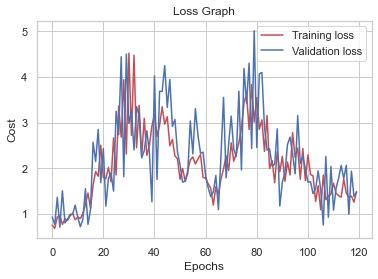

Fold 2


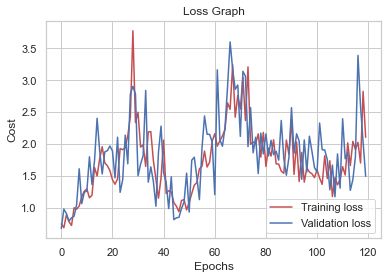

Fold 3


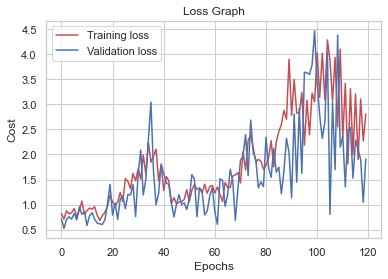

Fold 4


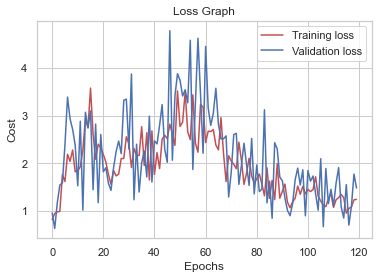

AUC Val: 0.6101029163100667
AUC Train: 0.6404186049102227
Specificity: 0.7198215812921336
Sensitivity: 0.46909602287447993
Positive Predictive Value: 0.48358338960634484
Negative Predictive Value: 0.7106764298885753
1
Fold 0


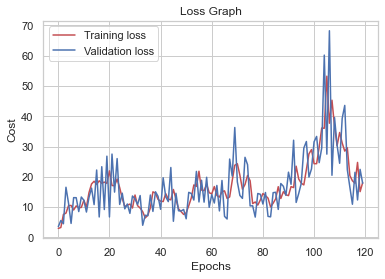

Fold 1


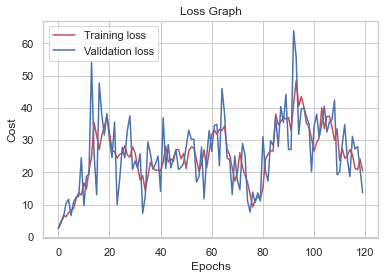

Fold 2


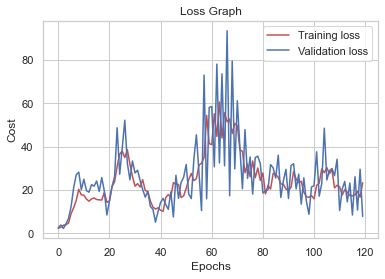

Fold 3


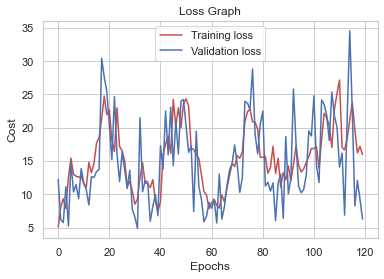

Fold 4


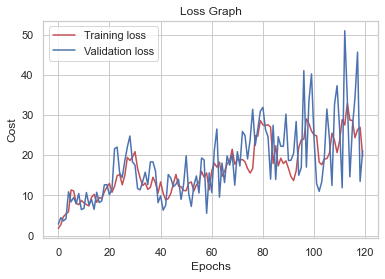

AUC Val: 0.5851664143830531
AUC Train: 0.6135319591542421
Specificity: 0.7619080934243486
Sensitivity: 0.406924009438354
Positive Predictive Value: 0.4585781757633412
Negative Predictive Value: 0.7090674199804086


In [323]:
aucLrPolys = []
lrs = [1e-5, 1e-4, 1e-3, 1e-2, 0.1, 1]
for lr in lrs:
    print(lr)
    lrPred, aucLr, speLr, senLr, ppvLr, npvLr, aucTrainLr = cross_val('lr'+str(lr) ,replaceNulls=True, nullColumns=['Glucose','BloodPressure','SkinThickness','BMI'], columnsToRemove=removeCols,polyFeatDeg=bestPolReguL2Deg, regu="l2", learning_rate=lr)
    aucLrPolys.append(aucLr)

bestLr = lrs[aucLrPolys.index(max(aucLrPolys))]

In [324]:
print('Best LR: ' + str(bestLr) + " --- AUC: " + str(max(aucLrPolys)))

Best LR: 0.0001 --- AUC: 0.8515340311020625


### Variando momentum

0.9
Fold 0


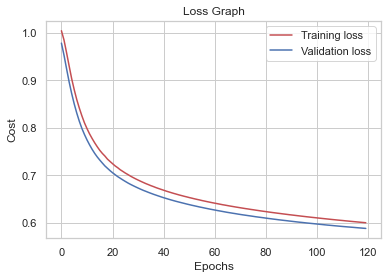

Fold 1


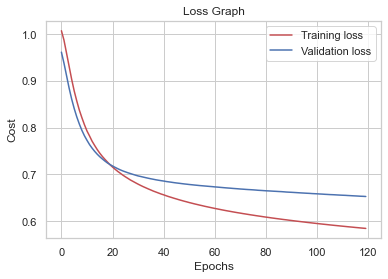

Fold 2


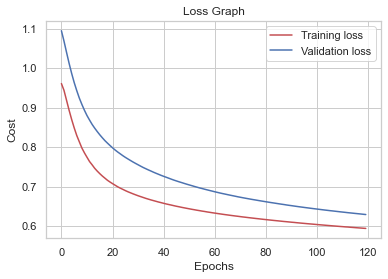

Fold 3


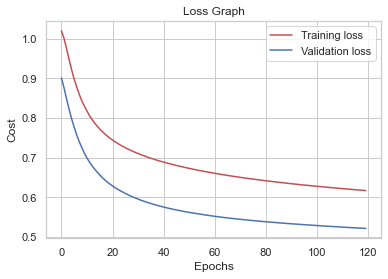

Fold 4


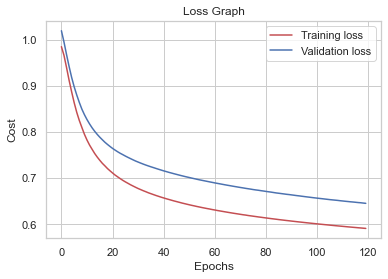

AUC Val: 0.841254096537886
AUC Train: 0.8470126656934287
Specificity: 0.8907478221302515
Sensitivity: 0.5194972995481704
Positive Predictive Value: 0.7131553608627872
Negative Predictive Value: 0.7733112618687665
0.99
Fold 0


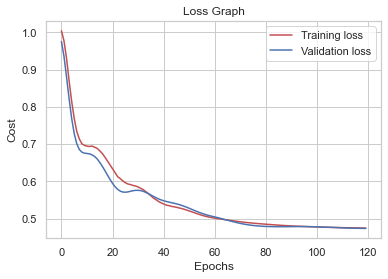

Fold 1


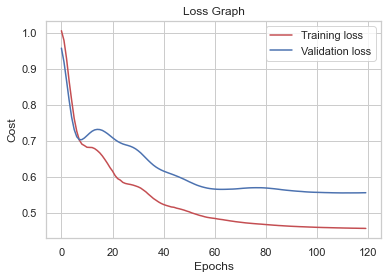

Fold 2


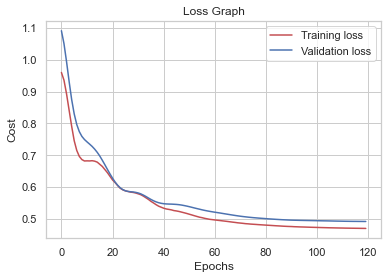

Fold 3


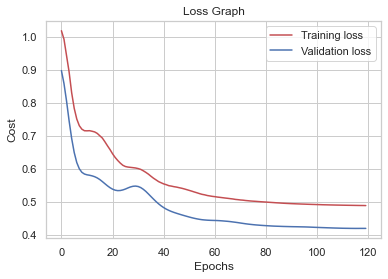

Fold 4


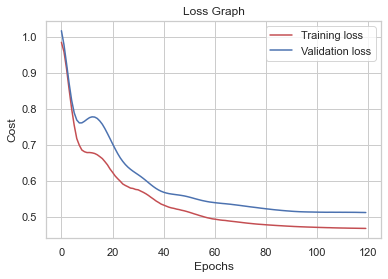

AUC Val: 0.8517146630501555
AUC Train: 0.8622359475643888
Specificity: 0.890785873880527
Sensitivity: 0.5477493624831176
Positive Predictive Value: 0.7248736070664741
Negative Predictive Value: 0.7819560069550444
0.999
Fold 0


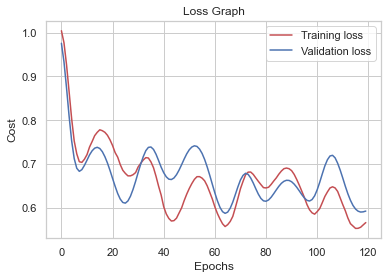

Fold 1


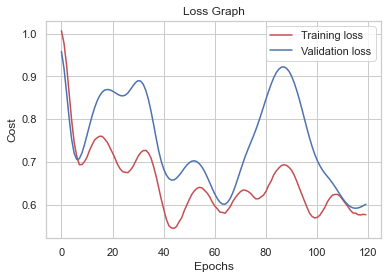

Fold 2


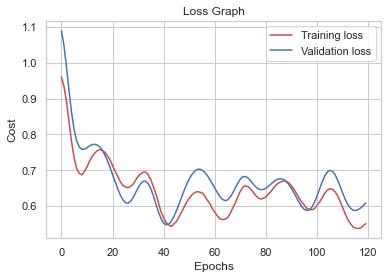

Fold 3


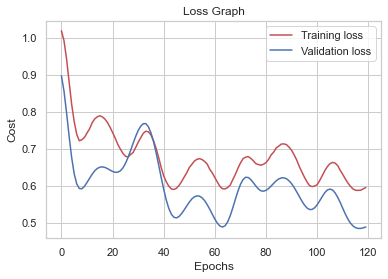

Fold 4


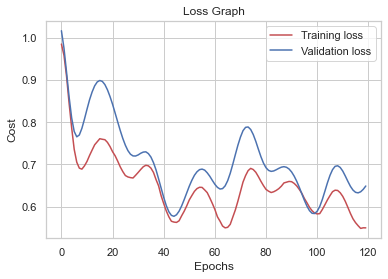

AUC Val: 0.8464477212250268
AUC Train: 0.8479164189387346
Specificity: 0.8533449132273002
Sensitivity: 0.6099435138090165
Positive Predictive Value: 0.6875336773658172
Negative Predictive Value: 0.7982146891771681


In [325]:
aucsMom = []
moms = [0.9, 0.99, 0.999]
for mom in moms:
    print(mom)
    momPred, aucMom, speMom, senMom, ppvMom, npvMom, aucTrainMom = cross_val('lr'+str(lr) ,replaceNulls=True, nullColumns=['Glucose','BloodPressure','SkinThickness','BMI'], columnsToRemove=removeCols, polyFeatDeg=bestPolReguL2Deg, regu="l2", learning_rate=bestLr, momentum=mom)
    aucsMom.append(aucMom)

bestMom = moms[aucsMom.index(max(aucsMom))]

In [326]:
print('Best Mom: ' + str(bestMom) + " --- AUC: " + str(max(aucsMom)))

Best Mom: 0.99 --- AUC: 0.8517146630501555


### Variando learning rate decay

0.001
Fold 0


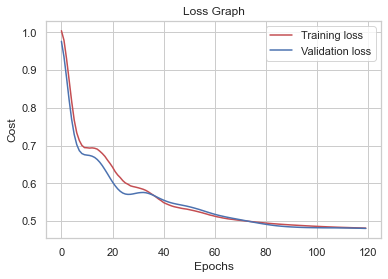

Fold 1


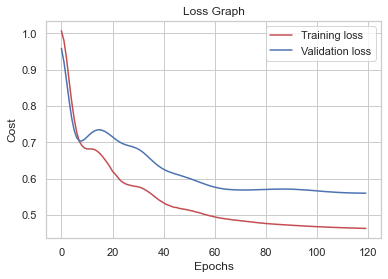

Fold 2


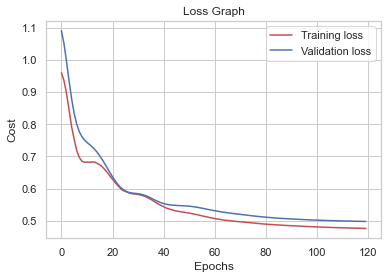

Fold 3


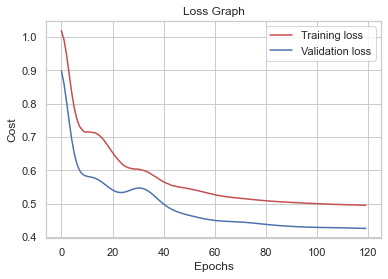

Fold 4


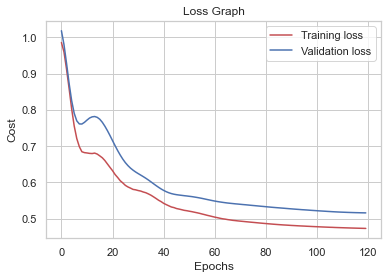

AUC Val: 0.850315791292196
AUC Train: 0.8622471790876591
Specificity: 0.8929597869216425
Sensitivity: 0.5516709311028792
Positive Predictive Value: 0.7304446755989393
Negative Predictive Value: 0.7838976728157772
0.0001
Fold 0


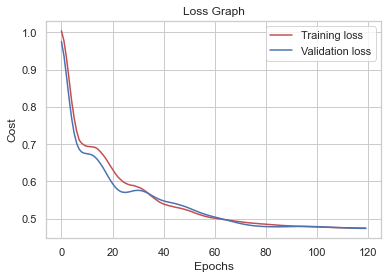

Fold 1


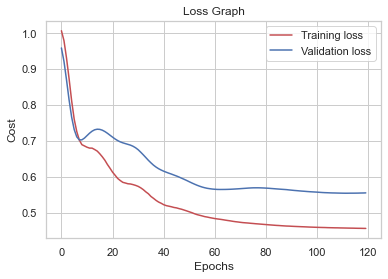

Fold 2


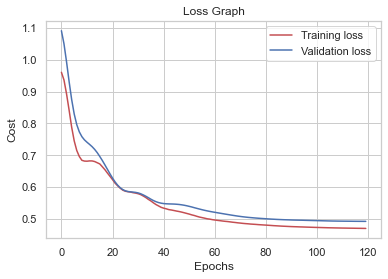

Fold 3


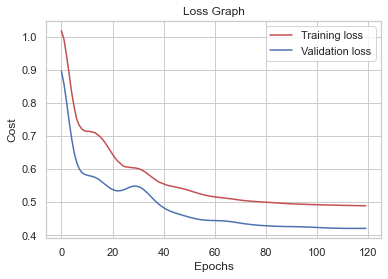

Fold 4


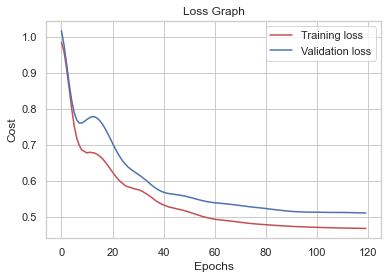

AUC Val: 0.8516899435527524
AUC Train: 0.8622317758577044
Specificity: 0.890785873880527
Sensitivity: 0.5516709311028792
Positive Predictive Value: 0.7257648726761252
Negative Predictive Value: 0.783628915815226
1e-05
Fold 0


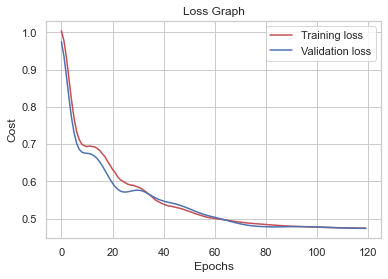

Fold 1


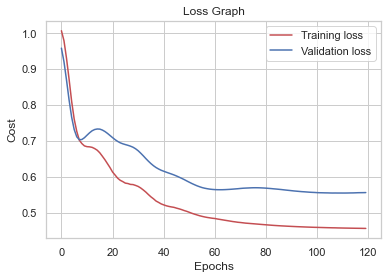

Fold 2


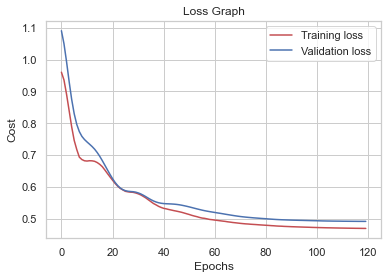

Fold 3


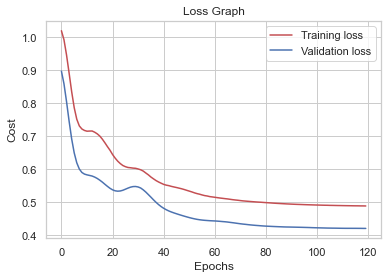

Fold 4


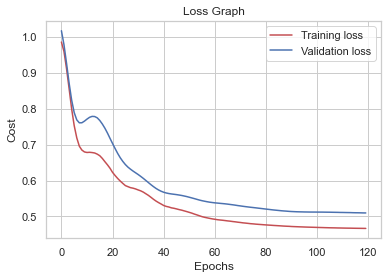

AUC Val: 0.8512586903817733
AUC Train: 0.8623460098593816
Specificity: 0.890785873880527
Sensitivity: 0.5477493624831176
Positive Predictive Value: 0.7248736070664741
Negative Predictive Value: 0.7819560069550444


In [327]:
aucsDecays = []
decays = [1e-3, 1e-4, 1e-5]
for dec in decays:
    print(dec)
    decPred, aucDec, speDec, senDec, ppvDec, npvDec, aucTrainDec = cross_val("dec"+str(dec),replaceNulls=True, nullColumns=['Glucose','BloodPressure','SkinThickness','BMI'], columnsToRemove=removeCols, polyFeatDeg=bestPolReguL2Deg, regu="l2", learning_rate=bestLr, momentum=bestMom, decay=dec)
    aucsDecays.append(aucDec)

bestDec = decays[aucsDecays.index(max(aucsDecays))]

In [328]:
print('Best Decay: ' + str(bestDec) + " --- AUC: " + str(max(aucsDecays)))

Best Decay: 0.0001 --- AUC: 0.8516899435527524


Fold 0


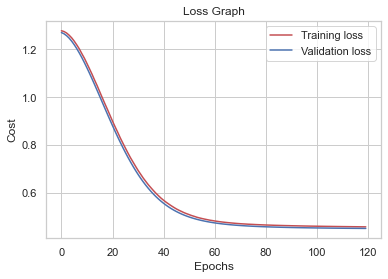

Fold 1


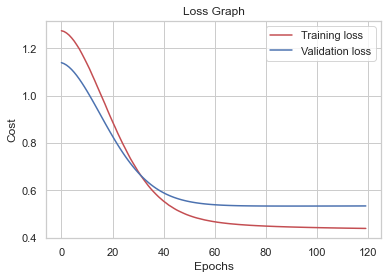

Fold 2


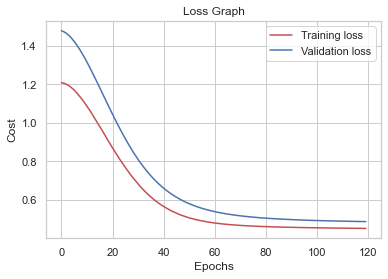

Fold 3


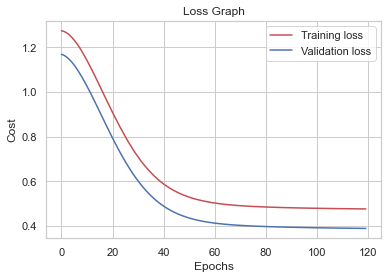

Fold 4


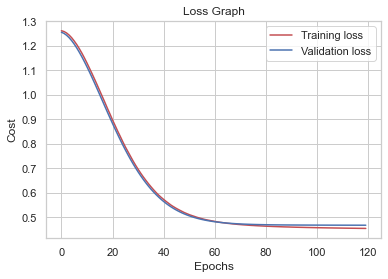

AUC Val: 0.845222950922954
AUC Train: 0.8517377860674156
Specificity: 0.8624649014942062
Sensitivity: 0.5889084021348511
Positive Predictive Value: 0.6925169169101821
Negative Predictive Value: 0.7910764959378623


(<__main__.DiabetesPredictor at 0x1eb5d6f2bb0>,
 0.845222950922954,
 0.8624649014942062,
 0.5889084021348511,
 0.6925169169101821,
 0.7910764959378623,
 0.8517377860674156)

In [330]:
cross_val("withoutReg",replaceNulls=True, nullColumns=['Glucose','BloodPressure','SkinThickness','BMI'], columnsToRemove=removeCols, learning_rate=bestLr, momentum=bestMom, decay=bestDec)

### Multilayer

Fold 0


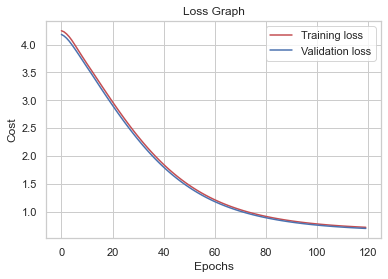

Fold 1


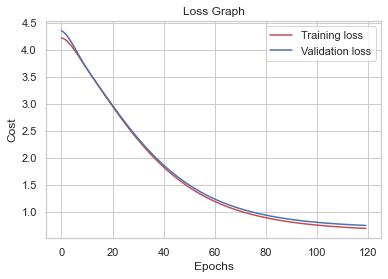

Fold 2


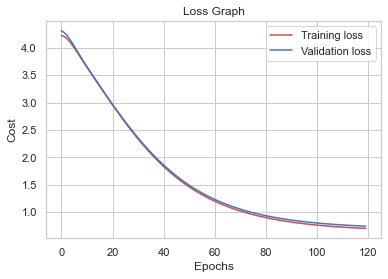

Fold 3


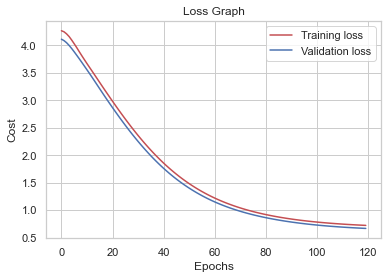

Fold 4


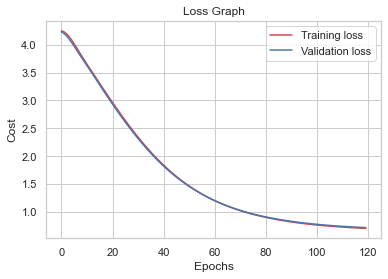

AUC Val: 0.8247887081756613
AUC Train: 0.8265078605949547
Specificity: 0.9735956764739193
Sensitivity: 0.22662356709148565
Positive Predictive Value: 0.8356643273071779
Negative Predictive Value: 0.6988729318414872


(<__main__.DiabetesPredictor at 0x1eb4c64a910>,
 0.8247887081756613,
 0.9735956764739193,
 0.22662356709148565,
 0.8356643273071779,
 0.6988729318414872,
 0.8265078605949547)

In [334]:
cross_val('multi',replaceNulls=True, nullColumns=['Glucose','BloodPressure','SkinThickness','BMI'], columnsToRemove=removeCols, polyFeatDeg=bestPolReguL2Deg, regu="l2", learning_rate=bestLr, momentum=bestMom, decay=bestDec, multilayer=True, layerUnits = [12,8] )

Fold 0


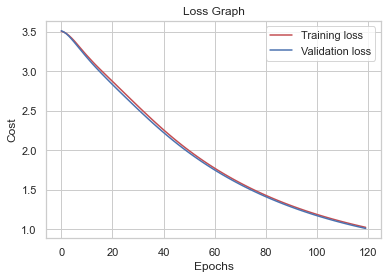

Fold 1


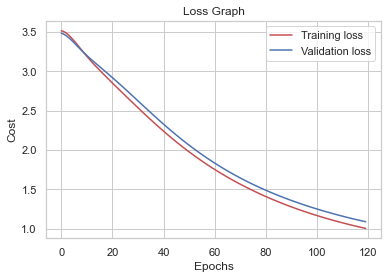

Fold 2


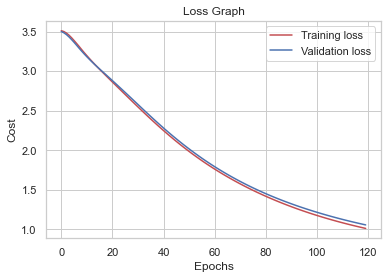

Fold 3


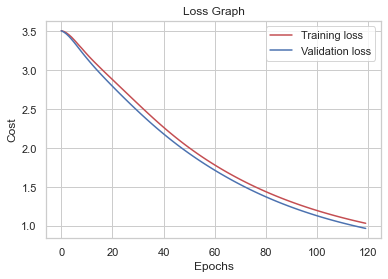

Fold 4


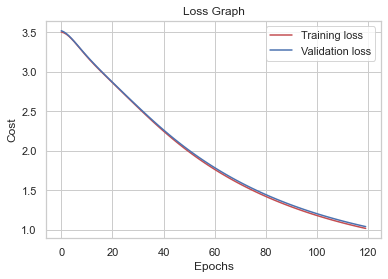

AUC Val: 0.8414211559723048
AUC Train: 0.8529045318736601
Specificity: 0.892530274836074
Sensitivity: 0.5251949739509083
Positive Predictive Value: 0.7206969577155703
Negative Predictive Value: 0.7750001491444333


(<__main__.DiabetesPredictor at 0x1eb5f30a820>,
 0.8414211559723048,
 0.892530274836074,
 0.5251949739509083,
 0.7206969577155703,
 0.7750001491444333,
 0.8529045318736601)

In [347]:
cross_val('multi2',replaceNulls=True, nullColumns=['Glucose','BloodPressure','SkinThickness','BMI'], columnsToRemove=removeCols, polyFeatDeg=bestPolReguL2Deg, regu="l2", learning_rate=bestLr, momentum=bestMom, decay=bestDec, multilayer=True, layerUnits = [20,20] )

Fold 0


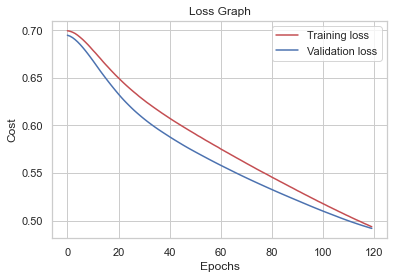

Fold 1


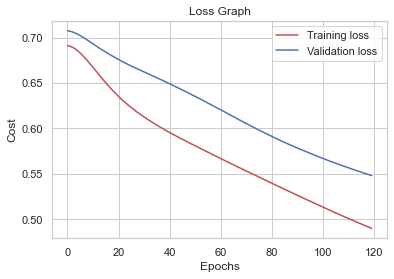

Fold 2


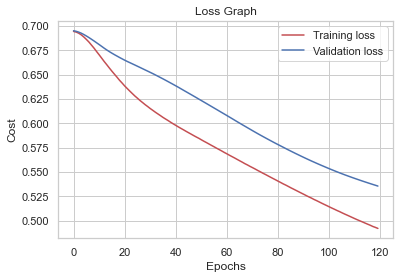

Fold 3


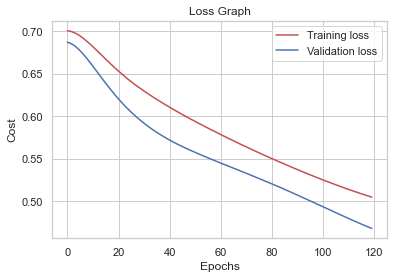

Fold 4


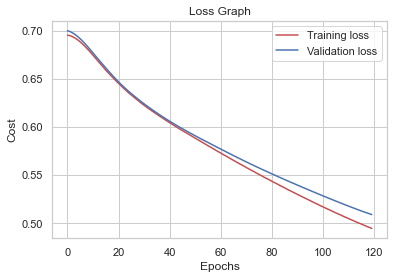

AUC Val: 0.8213800211500655
AUC Train: 0.834810699025148
Specificity: 0.869945733798707
Sensitivity: 0.5592686393161614
Positive Predictive Value: 0.695335395255549
Negative Predictive Value: 0.7814528163610692


(<__main__.DiabetesPredictor at 0x1eb5eeb4400>,
 0.8213800211500655,
 0.869945733798707,
 0.5592686393161614,
 0.695335395255549,
 0.7814528163610692,
 0.834810699025148)

In [339]:
cross_val('multi3',replaceNulls=True, nullColumns=['Glucose','BloodPressure','SkinThickness','BMI'], columnsToRemove=removeCols,  learning_rate=bestLr, momentum=bestMom, decay=bestDec, multilayer=True, layerUnits = [20,20] )

Fold 0


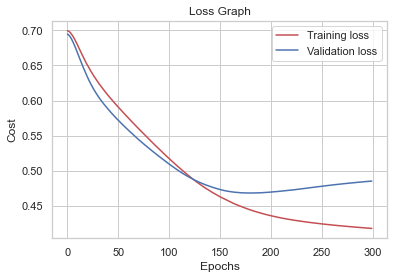

Fold 1


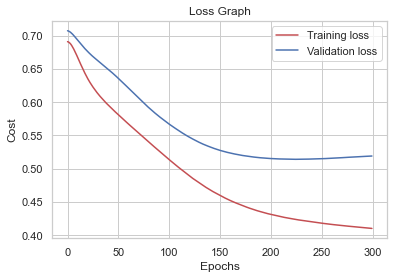

Fold 2


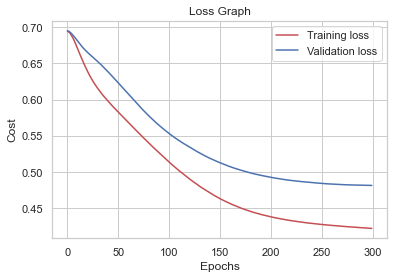

Fold 3


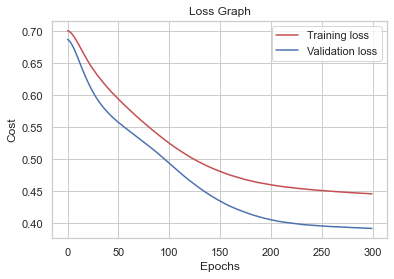

Fold 4


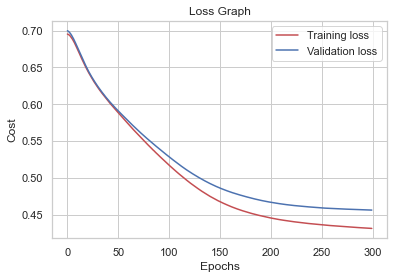

AUC Val: 0.8462211795015164
AUC Train: 0.8705065699094077
Specificity: 0.8573822748427196
Sensitivity: 0.5795703323568407
Positive Predictive Value: 0.6840476171470167
Negative Predictive Value: 0.7873231527557629


(<__main__.DiabetesPredictor at 0x1eb5f7a82b0>,
 0.8462211795015164,
 0.8573822748427196,
 0.5795703323568407,
 0.6840476171470167,
 0.7873231527557629,
 0.8705065699094077)

In [349]:
cross_val('multi4',replaceNulls=True, nullColumns=['Glucose','BloodPressure','SkinThickness','BMI'], columnsToRemove=removeCols,  learning_rate=bestLr, momentum=bestMom, decay=bestDec, multilayer=True, layerUnits = [20,20], epochs=300 )

Fold 0


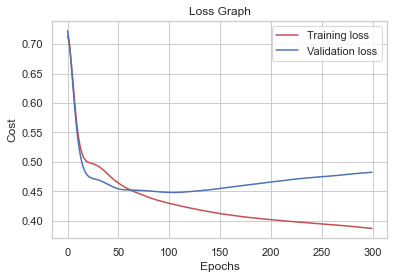

Fold 1


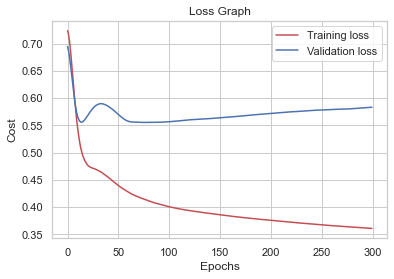

Fold 2


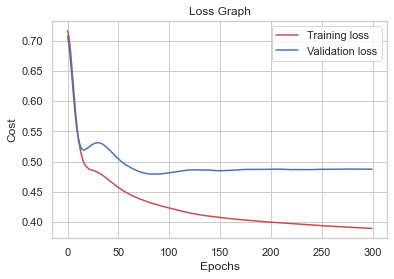

Fold 3


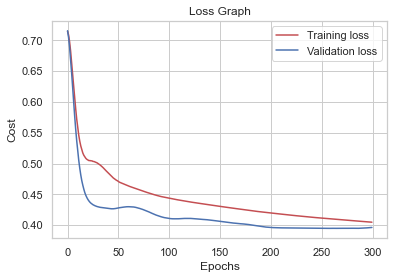

Fold 4


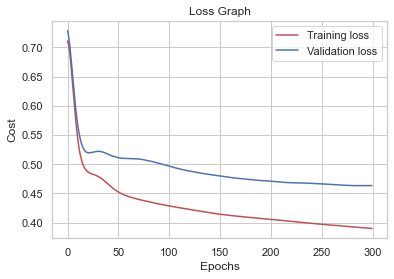

AUC Val: 0.8393723967630029
AUC Train: 0.8948659617203528
Specificity: 0.8304658138305705
Sensitivity: 0.6138818513230103
Positive Predictive Value: 0.6591607794034748
Negative Predictive Value: 0.7952677696383512


(<__main__.DiabetesPredictor at 0x1eb5aa87880>,
 0.8393723967630029,
 0.8304658138305705,
 0.6138818513230103,
 0.6591607794034748,
 0.7952677696383512,
 0.8948659617203528)

In [344]:
cross_val('multi5',replaceNulls=True, nullColumns=['Glucose','BloodPressure','SkinThickness','BMI'], columnsToRemove=removeCols,  learning_rate=bestLr, momentum=bestMom, decay=bestDec, multilayer=True, layerUnits = [20,20], epochs=300, polyFeatDeg=3 )

Fold 0


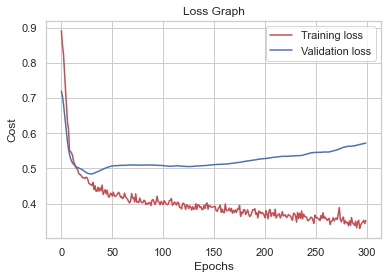

Fold 1


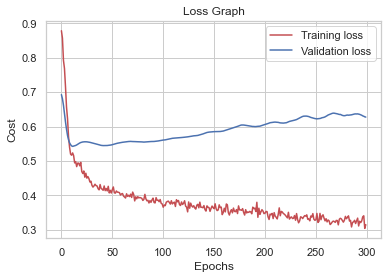

Fold 2


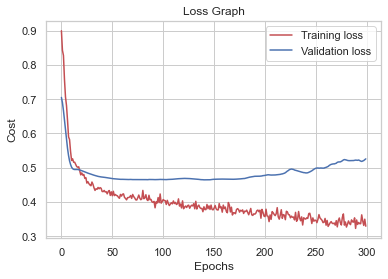

Fold 3


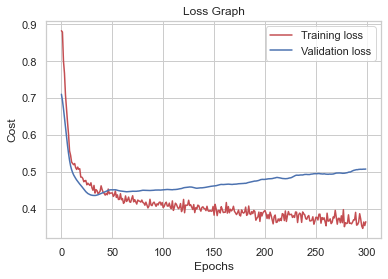

Fold 4


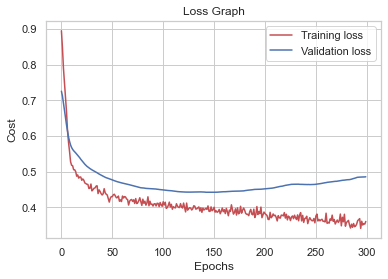

AUC Val: 0.8079953001762078
AUC Train: 0.9355005366676259
Specificity: 0.8139853880486756
Sensitivity: 0.6084485812705294
Positive Predictive Value: 0.6353140328015201
Negative Predictive Value: 0.7919955658471476


(<__main__.DiabetesPredictor at 0x1eb68f724c0>,
 0.8079953001762078,
 0.8139853880486756,
 0.6084485812705294,
 0.6353140328015201,
 0.7919955658471476,
 0.9355005366676259)

In [345]:
cross_val('multi6',replaceNulls=True, nullColumns=['Glucose','BloodPressure','SkinThickness','BMI'], columnsToRemove=removeCols,  learning_rate=bestLr, momentum=bestMom, decay=bestDec, multilayer=True, layerUnits = [20,20], epochs=300, polyFeatDeg=3, batchNormalization=True )

### El mejor modelo obtenido:

Fold 0


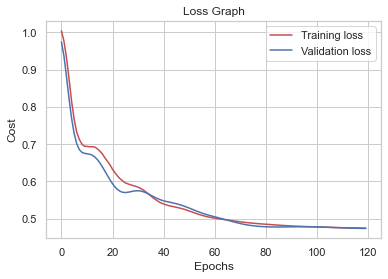

Fold 1


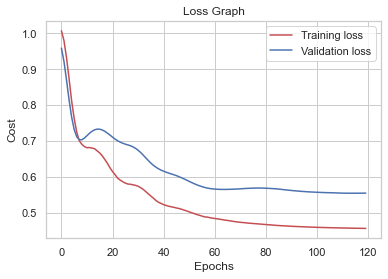

Fold 2


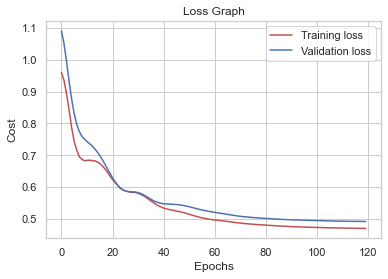

Fold 3


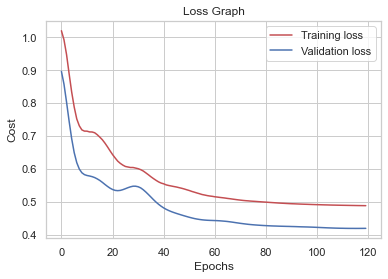

Fold 4


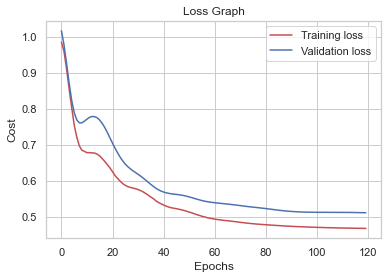

AUC Val: 0.8516767932535192
AUC Train: 0.8622793682778476
Specificity: 0.890785873880527
Sensitivity: 0.5516709311028792
Positive Predictive Value: 0.7257648726761252
Negative Predictive Value: 0.783628915815226


In [351]:
bestPred, aucBest, speBest, senBest, ppvBest, npvBest, aucTrainLr =cross_val("best",replaceNulls=True, nullColumns=['Glucose','BloodPressure','SkinThickness','BMI'], columnsToRemove=removeCols, polyFeatDeg=bestPolReguL2Deg, regu="l2", learning_rate=bestLr, momentum=bestMom, decay=bestDec)

## Test

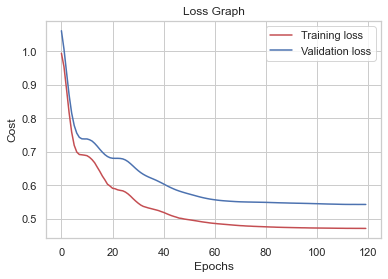

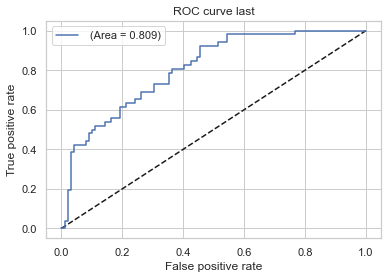

AUC 0.8088578088578088
Specificity: tf.Tensor(0.9191919182634426, shape=(), dtype=float64)
Sensitivity: tf.Tensor(0.4423076914571006, shape=(), dtype=float64)
Positive Predictive Value: tf.Tensor(0.7419354814776274, shape=(), dtype=float64)
Negative Predictive Value: tf.Tensor(0.7583333327013889, shape=(), dtype=float64)


In [373]:
lastModel = DiabetesPredictor('last')
lastModel.fit(train_val_data, y_train_val, x_test_data, y_test_values,replaceNulls=True, nullColumns=['Glucose','BloodPressure','SkinThickness','BMI'], columnsToRemove=removeCols, polyFeatDeg=bestPolReguL2Deg, regu="l2", learning_rate=bestLr, momentum=bestMom, decay=bestDec, testing=True)